# preparing

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer
from sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import shuffle
import scipy.stats as stats
from scipy.stats import anderson, kruskal
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Lasso, Ridge
from sklearn.feature_selection import mutual_info_classif, f_classif
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import classification_report, f1_score, confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, LeakyReLU, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.metrics import F1Score
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, Callback
from tensorflow.keras.utils import to_categorical
from sklearn.manifold import TSNE
import plotly.express as px
from xgboost import XGBClassifier
from mrmr import mrmr_classif
from ydata_profiling import ProfileReport
import optuna
from sklearn.metrics import accuracy_score
import json

2025-05-01 09:56:10.722142: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-01 09:56:10.722861: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-01 09:56:10.726409: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-01 09:56:10.738547: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746111370.757248    4904 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746111370.76

In [2]:
abundance_matrix = pd.read_csv("Data/vect_atlas.csv", index_col=0).T
abundance_matrix.head()

,msp_0001,msp_0002,msp_0003,msp_0004,msp_0005,msp_0006,msp_0007,msp_0008,msp_0009,msp_0010,...,msp_2176,msp_2178,msp_2180,msp_2191,msp_2195,msp_2196,msp_2207,msp_2209,msp_2210,msp_2211
DRS087519,0.0,0.0,0.000000e+00,0.0,1.445833e-05,0.0,2.207703e-06,0.0,3.475366e-07,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,9.262575e-08,0.0,0.0,0.0
DRS087520,0.0,0.0,7.041625e-08,0.0,1.017152e-05,0.0,9.057479e-08,0.0,1.164234e-06,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0
DRS087521,0.0,0.0,2.414685e-05,0.0,0.000000e+00,0.0,0.000000e+00,0.0,3.902975e-07,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0
DRS087522,0.0,0.0,6.538314e-08,0.0,1.382547e-07,0.0,1.204665e-06,0.0,0.000000e+00,7.128602e-08,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0
DRS087523,0.0,0.0,8.276546e-07,0.0,3.320195e-08,0.0,1.451805e-07,0.0,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0


In [3]:
metadata = pd.read_csv("Data/sampleID.csv")
metadata.head()

,sample.ID,BioProject,type,Age,Gender,BMI,Geography,Sequencer,MgsRichness,GeneRichness,enteroType,Disease,IGC2mappedReadCount,IGC2mappedPercent
0,ERS608599,PRJEB7774,Disease,64.0,Male,29.0,Austria,Illumina HiSeq 2000,184,563013,ET-Bacteroides,CRC,31667213,84.7
1,ERS608499,PRJEB7774,Control,68.0,Male,32.0,Austria,Illumina HiSeq 2000,265,686859,ET-Firmicutes,Healthy,49108139,78.8
2,ERS608489,PRJEB7774,Control,60.0,Female,22.0,Austria,Illumina HiSeq 2000,228,616715,ET-Firmicutes,Healthy,47406052,83.4
3,ERS608554,PRJEB7774,Disease,70.0,Male,34.0,Austria,Illumina HiSeq 2000,236,628862,ET-Firmicutes,Adenoma,39639265,83.3
4,ERS608521,PRJEB7774,Control,68.0,Male,23.0,Austria,Illumina HiSeq 2000,254,627031,ET-Firmicutes,Healthy,40564563,83.3


In [4]:
merged = pd.merge(metadata, abundance_matrix, left_on='sample.ID', right_index=True, how='inner')
merged.shape

(6014, 2004)

# msp taxon mapping

In [5]:
mapping_df = pd.read_csv("Data/msp_name.csv")
mapping_df.head()

,msp,phylum,class,order,family,genus,species
0,msp_0001,unclassified Eukaryota,unclassified Eukaryota,unclassified Eukaryota,unclassified Eukaryota,Blastocystis,Blastocystis sp. subtype 3
1,msp_0002,unclassified Eukaryota,unclassified Eukaryota,unclassified Eukaryota,unclassified Eukaryota,Blastocystis,Blastocystis sp. subtype 1
2,msp_0003,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides cellulosilyticus
3,msp_0004,unclassified Eukaryota,unclassified Eukaryota,unclassified Eukaryota,unclassified Eukaryota,Blastocystis,Blastocystis sp. subtype 2
4,msp_0005,Proteobacteria,Gammaproteobacteria,Enterobacterales,Enterobacteriaceae,Escherichia,Escherichia coli


In [6]:
def taxon_aggregate(msp_df, mapping_df, t_order):

  # Crear un diccionario de mapeo
  column_mapping = dict(zip(mapping_df['msp'], mapping_df[t_order]))

  # Renombrar las columnas del DataFrame original
  msp_df = msp_df.rename(columns=column_mapping)

  # Agrupar por nombres repetidos y sumar horizontalmente
  msp_df = msp_df.T.groupby(level=0).sum().T

  return msp_df

# Data preprocessing

## scarcity evaluation
- Remove MSP where sum is fewer than q25
- Remove MSP which were present in fewer than 1% of samples

In [7]:
def data_cleaning(df):

  q1 = df.sum().quantile(0.25)

  new_cols = list(filter( lambda x: df[x].sum() > q1, df.columns))

  new_cols = list(filter( lambda x: (df[x] > 0).sum() / df.shape[0] > 0.1, new_cols))
  return df[new_cols]

## Scaling

In [8]:
def scaling(df, scaler):
  if scaler == "std":
    scaler = StandardScaler()
  elif scaler == "minmax":
    scaler = MinMaxScaler()
  elif scaler == "norm":
    scaler = Normalizer(norm="l1")
  scaled_data = scaler.fit_transform(df)

  return pd.DataFrame(scaled_data, columns=df.columns, index=df.index)

## Graphic analysis

In [9]:
def visualization(Xy, g_type, lim):
  X = Xy.drop(columns=["Disease"])
  y = Xy["Disease"]

  for col in X.columns[:12]:
    if g_type == "hist":
      sns.histplot(data=X, x=col, hue=y, kde=False, bins=30, stat="density", common_norm=False)
    elif g_type == "kde":
      sns.kdeplot(data=X, x=col, hue=y, common_norm=False)
    elif g_type == "box":
      sns.boxplot(x = 'Disease', y = col, data = Xy)
      #sns.boxplot(x=y, y=X[col])
    elif g_type == "norm":
      stats.probplot(X[col], dist="norm", plot=plt)
    plt.title(f'{col}')
    plt.show()

def tsne_perplexity_vis(Xy, n_components = 3):
  X = Xy.drop(columns=["Disease"])

  perplexity = np.arange(5, 55, 5)
  divergence = []

  for i in perplexity:
      model = TSNE(n_components=n_components, init="pca", perplexity=i)
      reduced = model.fit_transform(X)
      divergence.append(model.kl_divergence_)
  fig = px.line(x=perplexity, y=divergence, markers=True)
  fig.update_layout(xaxis_title="Perplexity Values", yaxis_title="Divergence")
  fig.update_traces(line_color="red", line_width=1)
  fig.show()

## statistic analysis

In [10]:
def interpret_anderson(result):
  #sig level 0.05
  i = 2
  sl, cv = result.significance_level[i], result.critical_values[i]
  print(sl, cv, result.statistic)
  if result.statistic < cv:
    return True
  else:
    return False

In [11]:
def stat(Xy, s_type, lim):
  X = Xy.drop(columns=["Disease"])
  y = Xy["Disease"]

  for col in X.columns[:12]:
    if s_type == "norm":
      result_normal = interpret_anderson(anderson(X[col], dist='norm'))
      print(f'{col} normality: {result_normal}')
    elif s_type == "kruskal":
      groups = [X[col][y == category] for category in y.unique()]
      stat, p_value = kruskal(*groups)

      if p_value < 0.05:
        print(f'{col} is significantly different\n')
      else:
        print(f'{col} is not significantly different\n')


## feature selection

In [12]:
def kruskal_test(X, y, features = False):
  new_columns = []
  for col in X.columns:
      groups = [X[col][y == category] for category in y.unique()]
      stat, p_value = kruskal(*groups)
      if p_value < 0.05:
          new_columns.append(col)
  if features:
    return new_columns
  return X[new_columns]

def rf_selection(X, y, top_n = None, features = False):
  if top_n is None:
    top_n = 200

  rf = RandomForestClassifier(random_state=42)
  rf.fit(X, y)
  feature_importances = rf.feature_importances_
  feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
  })
  feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
  top_features = feature_importance_df.head(top_n)['Feature'].values
  if features:
    return top_features
  return X[top_features]

def xgboost_selection(X, y, top_n = None, features = False):

  xgb = XGBClassifier(eval_metric='mlogloss', random_state=42)
  xgb.fit(X.to_numpy(), y)

  feature_importances = xgb.feature_importances_
  feature_importance_df = pd.DataFrame({
      'Feature': X.columns,
      'Importance': feature_importances
  }).sort_values(by='Importance', ascending=False)

  threshold = 0.01  # Umbral arbitrario
  selected_features = feature_importance_df[feature_importance_df['Importance'] > threshold]['Feature']
  if features:
    return selected_features
  return X[selected_features]

def mutual_information(X, y, top_n = None, features = False):
  if top_n is None:
    top_n = 100
  mi_scores = mutual_info_classif(X, y, random_state=42)
  mi_df = pd.DataFrame({'Feature': X.columns, 'Mutual Info Score': mi_scores})
  mi_df = mi_df.sort_values(by='Mutual Info Score', ascending=False)
  top_features = mi_df.head(top_n)['Feature'].values
  if features:
    return top_features
  return X[top_features]

def mrmr_selection(X, y, top_n = None, features = False):
  if top_n is None:
    top_n = 100

  selected_features = mrmr_classif(X=X, y=y, K=top_n)

  if features:
    return selected_features
  return X[selected_features]

def ridge_fs(X, y, top_n = None, features = False):
  if top_n is None:
    top_n = 100

  ridge = Ridge(alpha=0.01)  # alpha es el parámetro de regularización
  ridge.fit(X, y)

  coef = ridge.coef_

  coef_df = pd.DataFrame(coef, index=X.columns, columns=['Coefficient'])
  coef_df = coef_df.abs().sort_values(by='Coefficient', ascending=False)  

  selected_features = coef_df.head(top_n).index.tolist()

  if features:
    return selected_features
  return X[selected_features]

def anova_fs(X, y, top_n = None, features = False):
  if top_n is None:
    top_n = 100
  F_values, p_values = f_classif(X, y)

  anova_df = pd.DataFrame({
      'Feature': X.columns,
      'F-value': F_values,
      'P-value': p_values
  })
  anova_df = anova_df.sort_values(by='F-value', ascending=False)

  selected_features = anova_df.head(top_n)['Feature'].tolist()

  if features:
    return selected_features
  return X[selected_features]

# def lasso_fs(X, y, features = False):
#   lasso_model = Lasso(alpha=0.009)
#   lasso_model.fit(X, y)
#   lasso_coef = np.abs(lasso_model.coef_)
#   print(lasso_coef)

#   lasso_coefficients = pd.DataFrame({
#       'Feature': X.columns,
#       'Coefficient': lasso_coef
#   }).sort_values(by='Coefficient', key=abs, ascending=False)

#   selected_features = lasso_coefficients[lasso_coefficients['Coefficient'] > 0.0001]['Feature'].tolist()
#   if features:
#     return selected_features
#   return X[selected_features]

def pca_fs(X, top_n = None, features = False):
  if top_n is None:
    top_n = 100
  pca = PCA(n_components = top_n)
  X_pca = pca.fit_transform(X)
  X_pca = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(top_n)])
  if features:
    pca

  return X_pca

def corr_fs(X, y, top_n = None, features = False):
  if top_n is None:
    top_n = 100

  y_ = pd.Series(y, name='target')

  correlations = pd.concat([X.reset_index(drop=True), y_], axis=1).corr()['target'].drop('target')

  corr_cols = correlations.abs().sort_values(ascending=False).head(top_n).index

  if features:
    return corr_cols
  return X[corr_cols]



## preprocessing and analysis pipelines

In [13]:
def pre_pipeline(df, disease, taxon, mapping_df, scaler, all_disease = True):
  #Select a disease
  bioProjects = metadata[metadata.Disease == disease].BioProject.unique()
  disease_df = df[df.BioProject.isin(bioProjects)]
  if not all_disease:
    disease_df = disease_df[(disease_df.Disease == disease) | (disease_df.Disease == 'Healthy')]


  X = disease_df.drop(columns=["Disease"])[abundance_matrix.columns]
  y = disease_df["Disease"]

  #Select a taxon
  X_taxon = taxon_aggregate(X, mapping_df, taxon)

  #Scarcity eval
  X_cleaned = data_cleaning(X_taxon)

  #Scale
  X_scaled = scaling(X_cleaned, scaler)

  # Concatenar después de resetear índices
  Xy = pd.concat([X_scaled, y], axis=1)

  return Xy

def vis_pipeline(df, disease, taxon, mapping_df, scaler, g_type, lim=10, all_disease = True):
  Xy = pre_pipeline(df, disease, taxon, mapping_df, scaler, all_disease)
  visualization(Xy, g_type, lim)

def tsne_perplexity_vis_pipeline(df, disease, taxon, mapping_df, scaler, n_components = 3, all_disease = True):
  Xy = pre_pipeline(df, disease, taxon, mapping_df, scaler, all_disease)
  tsne_perplexity_vis(Xy, n_components)

def stat_pipeline(df, disease, taxon, mapping_df, scaler, s_type, lim=10, all_disease = True):
  Xy = pre_pipeline(df, disease, taxon, mapping_df, scaler, all_disease)
  stat(Xy, s_type, lim)

def full_pipeline(df, disease, taxon, mapping_df, scaler, fs_type = None, all_disease = True, top_n = None, rescale = False):
  Xy = pre_pipeline(df, disease, taxon, mapping_df, scaler, all_disease)
  X = Xy.drop(columns=["Disease"])
  y = Xy["Disease"]

  le = LabelEncoder()
  unique_classes = y.unique()

  le.classes_ = np.array(sorted(unique_classes, key=lambda x: (x != "Healthy", x)))
  y_transformed = le.transform(y)
  if fs_type == "kruskal":
    X_transformed = kruskal_test(X, y)
  elif fs_type == "rf":
    X_transformed = rf_selection(X, y_transformed, top_n)
  elif fs_type == "mi":
    X_transformed = mutual_information(X, y_transformed, top_n)
  elif fs_type == "xgb":
    X_transformed = xgboost_selection(X, y_transformed, top_n)
  elif fs_type == "mrmr":
    X_transformed = mrmr_selection(X, y , top_n)
  elif fs_type == "pca":
    X_transformed = pca_fs(X, top_n)
  elif fs_type == "corr":
    X_transformed = corr_fs(X, y_transformed, top_n)
  elif fs_type == "ridge":
    X_transformed = ridge_fs(X, y_transformed, top_n)
  elif fs_type == "anova":
    X_transformed = anova_fs(X, y_transformed, top_n)
  elif fs_type == None:
    X_transformed = X
  # elif fs_type == "lasso":
  #   X_transformed = lasso_fs(X, y_transformed)
  if rescale:
    X_transformed = scaling(X_transformed, scaler)
  return X_transformed, y_transformed

def feature_selection_pipeline(X, y, fs_type, top_n=None):

  if fs_type == "kruskal":
    return kruskal_test(X, y, features=True)
  elif fs_type == "rf":
    return rf_selection(X, y, top_n, features=True)
  elif fs_type == "mi":
    return mutual_information(X, y, top_n, features=True)
  elif fs_type == "pca":
    return pca_fs(X, top_n, features=True)

# Data Analysis

['ACVD', 'Adenoma', 'BD', 'CD', 'CRC', 'GDM', 'Healthy', 'IGT', 'LC', 'ME/CFS', 'NAFLD', 'NGT', 'NSCLC', 'PD', 'RA', 'RCC', 'SPA', 'T1D', 'T2D', 'UC', 'VKH', 'atherosclerosis', 'melanoma']

In [87]:
pre_pipeline(merged, "ME/CFS", "genus", mapping_df, "std", False).Disease.value_counts()

Disease
Healthy    50
ME/CFS     50
Name: count, dtype: int64

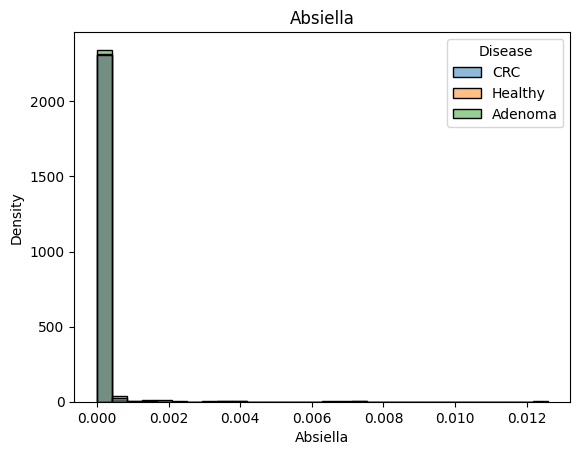

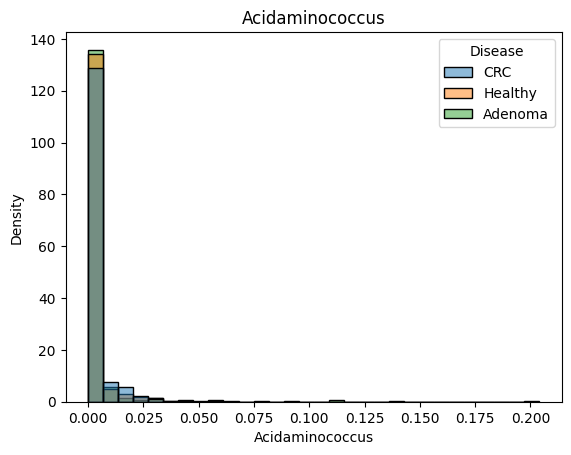

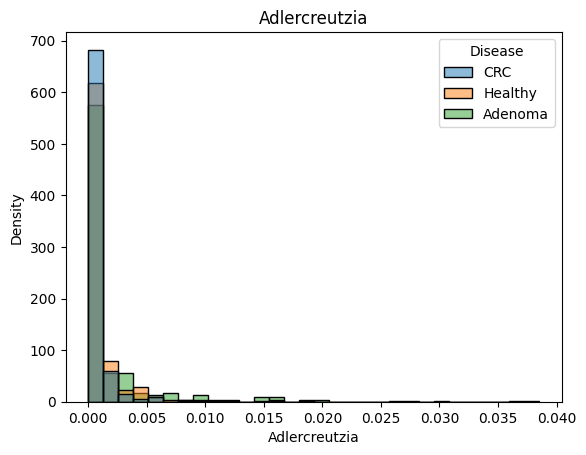

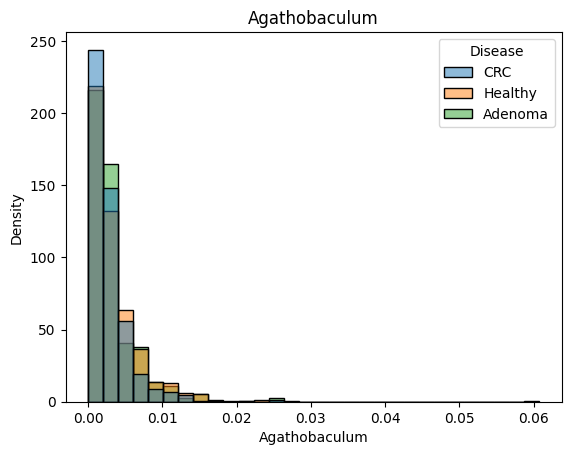

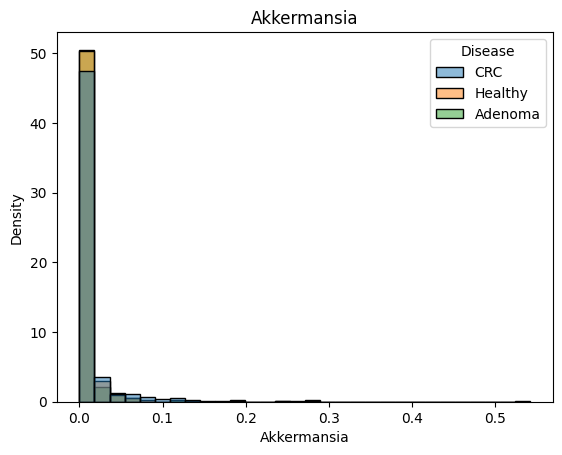

...

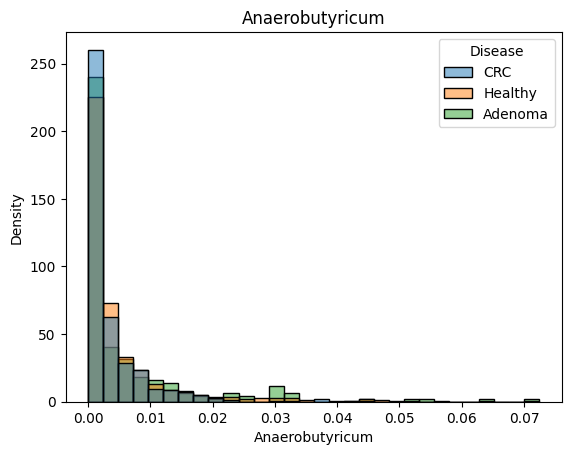

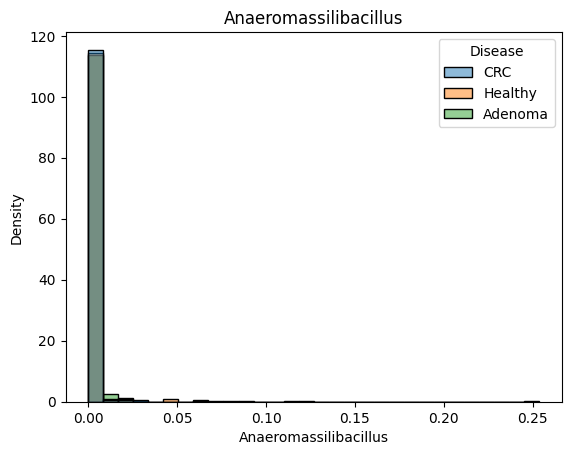

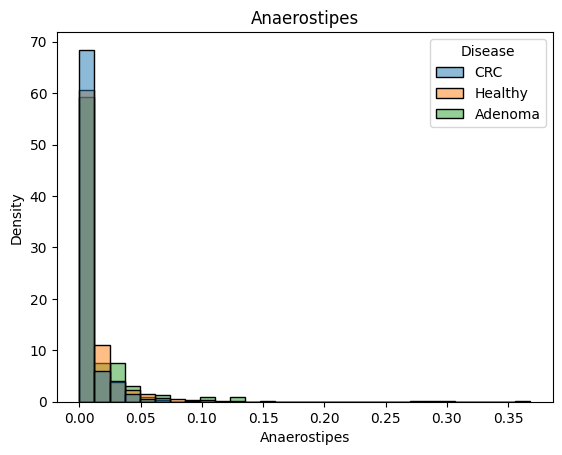

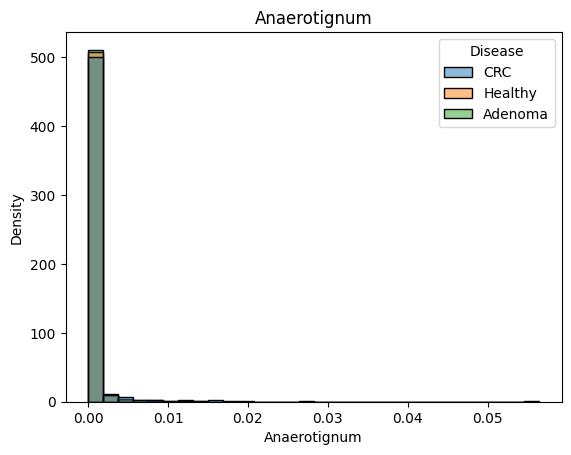

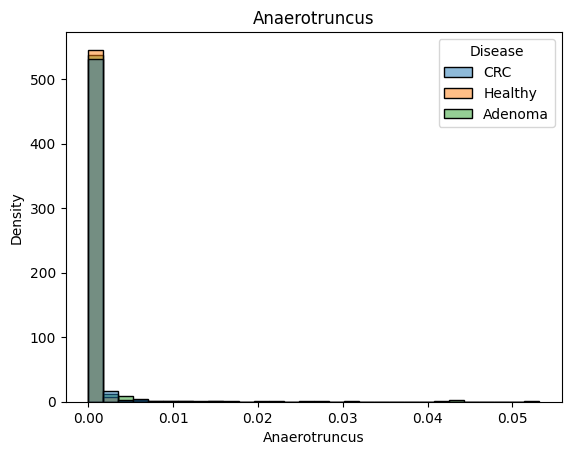

In [102]:
vis_pipeline(merged, "CRC", "genus", mapping_df, "norm", "hist")

In [ ]:
stat_pipeline(merged, "CRC", "genus", mapping_df, "std", "kruskal", all_disease=False)

# FS

CRC, LC, T1D

In [103]:
disease = "CRC"
X_kruskal, y_kruskal = full_pipeline(merged, disease, "species", mapping_df, "norm", "kruskal", all_disease=False, rescale=True)
X_rf, y_rf = full_pipeline(merged, disease, "species", mapping_df, "norm", "rf", all_disease=False, top_n = 200)
X_mi, y_mi = full_pipeline(merged, disease, "species", mapping_df, "norm", "mi", all_disease=False, top_n = 100)
X_xgb, y_xgb = full_pipeline(merged, disease, "species", mapping_df, "norm", "xgb", all_disease=False)
X_pca, y_pca = full_pipeline(merged, disease, "species", mapping_df, "norm", "pca", all_disease=False, top_n = 100)
X_mrmr, y_mrmr = full_pipeline(merged, disease, "species", mapping_df, "norm", "mrmr", all_disease=False, top_n = 100)
X_corr, y_corr = full_pipeline(merged, disease, "species", mapping_df, "norm", "corr", all_disease=False, top_n = 100)
X_ridge, y_ridge = full_pipeline(merged, disease, "species", mapping_df, "norm", "ridge", all_disease=False, top_n = 100)
X_anova, y_anova = full_pipeline(merged, disease, "species", mapping_df, "norm", "anova", all_disease=False, top_n = 100)
X_nfs, y_nfs = full_pipeline(merged, disease, "species", mapping_df, "norm", all_disease=False)

X_train, X_test, y_train, y_test = train_test_split(X_mi, y_mi, test_size=0.2, random_state=0)

100%|██████████| 100/100 [00:03<00:00, 28.57it/s]


# Train data

In [122]:
def eval_model(y_test, y_pred):
  report = classification_report(y_test, y_pred)
  cm = confusion_matrix(y_test, y_pred)
  print(report)
  print("confusion matrix: \n", cm)

## MLP

In [137]:
class F1Callback(Callback):
    def __init__(self, validation_data, path = 'best_model/temp'):
        self.validation_data = validation_data
        self.best_f1 = -1
        self.path = path

    def on_epoch_end(self, epoch, logs=None):
        X_val, y_val = self.validation_data
        y_pred = (self.model.predict(X_val) > 0.5).astype(int)
        f1 = f1_score(y_val, y_pred, average="macro")
        #print(f"Epoch {epoch + 1}: F1-score = {f1:.4f}")
        
        # Guardar el modelo si F1 mejora
        if f1 > self.best_f1:
            self.best_f1 = f1
            self.model.save(f'{self.path}/best_model_f1.keras')

def simple_nn(input_size):
  model = Sequential()
  model.add(Input(shape=(input_size,)))
  model.add(Dense(512))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.25))
  model.add(Dense(512))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.25))
  model.add(Dense(512))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.25))
  model.add(Dense(512))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.25))
  model.add(Dense(512))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.25))
  model.add(Dense(1))
  model.add(Activation('sigmoid'))
  model.compile(loss='binary_crossentropy',
                optimizer=Adam(learning_rate=0.0001),
                metrics=['accuracy'])
  return model

## CV

In [94]:
def cross_val(X, y, model, log = True, model_name = None):

  X = X.to_numpy()
  
  kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
  
  classification_reports = []

  # Cross-validation
  for fold, (train_idx, test_idx) in enumerate(kf.split(X, y)):

      X_train, X_test = X[train_idx], X[test_idx]
      y_train, y_test = y[train_idx], y[test_idx]
      
      if model_name == "mlp":
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)
        f1_callback = F1Callback(validation_data=(X_test, y_test))

        model = simple_nn(X_train.shape[1])
        model.fit(X_train, y_train ,epochs=100, batch_size=32,
                            validation_data=(X_test, y_test), callbacks=[f1_callback])
        best_model = tf.keras.models.load_model('best_model/temp/best_model_f1.keras')
        y_pred = best_model.predict(X_test)
        y_pred = (y_pred > 0.5)
      else:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
      
      report = classification_report(y_test, y_pred, output_dict=True)
      classification_reports.append(report)
      if log:
        # Imprimir el reporte para el fold actual
        print(f"Classification Report for Fold {fold}:\n")
        print(classification_report(y_test, y_pred))
        print(confusion_matrix(y_test, y_pred))
        print("=" * 50)

  # Promediar métricas entre folds (opcional)
  average_report = {
      metric: np.mean([fold_report[metric]["f1-score"] for fold_report in classification_reports])
      for metric in classification_reports[0].keys()
      if isinstance(classification_reports[0][metric], dict)
  }
  if log:
    print("Average F1-scores across folds:")
    for class_label, avg_score in average_report.items():
        print(f"Class {class_label}: {avg_score:.4f}")
  
  return average_report

def cv_compare(fs_methods: list, classification_algo: dict, diseases: list):

  for algo_name, algo in classification_algo.items():
    reports = []
    for disease in diseases:
      report = []
      for fs in fs_methods:
        X, y = full_pipeline(merged, disease, "species", mapping_df, "norm", fs, all_disease=False)
        average_report = cross_val(X, y, algo, log=False, model_name=algo_name)
        report.append(average_report['macro avg'])
      reports.append(report)
    pd.DataFrame(reports, index=diseases, columns=fs_methods).to_csv(f"results/{algo_name}.csv", sep=",", encoding="utf-8", float_format="%.3f")
    print(f"Saved result {algo_name}")

In [ ]:
fs_methods = ["pca", "corr", "ridge", "anova", "kruskal", "rf", "mi", "mrmr"]
algos = {
    # "knn" : KNeighborsClassifier(n_neighbors=3),
    "random forest": RandomForestClassifier(random_state=42),
    "Naive Bayes" : GaussianNB(),
    "xgb" : XGBClassifier(eval_metric='mlogloss', random_state=42),
    "mlp" : "create in cv"
}
diseases = ["T1D", "LC", "CRC"]
cv_compare(fs_methods, algos, diseases)

### Random Forest

In [104]:
rf = RandomForestClassifier(random_state=42)
cross_val(X_rf, y_rf, rf)

Classification Report for Fold 0:

              precision    recall  f1-score   support

           0       0.71      0.77      0.74       129
           1       0.76      0.70      0.73       133

    accuracy                           0.73       262
   macro avg       0.73      0.73      0.73       262
weighted avg       0.73      0.73      0.73       262

[[99 30]
 [40 93]]
Classification Report for Fold 1:

              precision    recall  f1-score   support

           0       0.70      0.77      0.73       129
           1       0.75      0.68      0.71       133

    accuracy                           0.72       262
   macro avg       0.72      0.72      0.72       262
weighted avg       0.72      0.72      0.72       262

[[99 30]
 [43 90]]
Classification Report for Fold 2:

              precision    recall  f1-score   support

           0       0.73      0.74      0.73       129
           1       0.74      0.73      0.73       132

    accuracy                           

{'0': np.float64(0.7413315111273762),
 '1': np.float64(0.7220229073374212),
 'macro avg': np.float64(0.7316772092323987),
 'weighted avg': np.float64(0.7315543901265542)}

### XGBoost

In [64]:
xgb = XGBClassifier(eval_metric='mlogloss', random_state=42)
cross_val(X_mi, y_mi, xgb)

Classification Report for Fold 0:

              precision    recall  f1-score   support

           0       0.68      0.71      0.69       129
           1       0.70      0.68      0.69       133

    accuracy                           0.69       262
   macro avg       0.69      0.69      0.69       262
weighted avg       0.69      0.69      0.69       262

[[91 38]
 [43 90]]
Classification Report for Fold 1:

              precision    recall  f1-score   support

           0       0.68      0.72      0.70       129
           1       0.71      0.68      0.69       133

    accuracy                           0.70       262
   macro avg       0.70      0.70      0.70       262
weighted avg       0.70      0.70      0.70       262

[[93 36]
 [43 90]]
Classification Report for Fold 2:

              precision    recall  f1-score   support

           0       0.72      0.73      0.73       129
           1       0.73      0.73      0.73       132

    accuracy                           

### Naive Bayes

In [151]:
gnb = GaussianNB()
cross_val(X_mi, y_mi, gnb)

Classification Report for Fold 0:

              precision    recall  f1-score   support

           0       0.88      0.64      0.74        11
           1       0.69      0.90      0.78        10

    accuracy                           0.76        21
   macro avg       0.78      0.77      0.76        21
weighted avg       0.79      0.76      0.76        21

[[7 4]
 [1 9]]
Classification Report for Fold 1:

              precision    recall  f1-score   support

           0       0.90      0.75      0.82        12
           1       0.73      0.89      0.80         9

    accuracy                           0.81        21
   macro avg       0.81      0.82      0.81        21
weighted avg       0.83      0.81      0.81        21

[[9 3]
 [1 8]]
Classification Report for Fold 2:

              precision    recall  f1-score   support

           0       0.82      0.82      0.82        11
           1       0.78      0.78      0.78         9

    accuracy                           0.80    

In [123]:
def rf_train_test(X_train, X_test, y_train, y_test):
  rf = RandomForestClassifier(random_state=42)
  rf.fit(X_train, y_train)

  y_pred = rf.predict(X_test)

  eval_model(y_test, y_pred)

In [50]:
rf_train_test(X_train, X_test, y_train, y_test)

              precision    recall  f1-score   support

           0       0.87      0.77      0.82        26
           1       0.86      0.93      0.89        40

    accuracy                           0.86        66
   macro avg       0.87      0.85      0.85        66
weighted avg       0.86      0.86      0.86        66

confusion matrix: 
 [[20  6]
 [ 3 37]]


### mlp test

In [19]:
y_train = y_train.reshape(-1, 1)
y_test = y_test.reshape(-1, 1)

In [20]:
f1_callback = F1Callback(validation_data=(X_test, y_test))

checkpoint = ModelCheckpoint(
    'best_model/temp/best_model.keras',                # Nombre del archivo donde se guarda el modelo
    monitor='val_accuracy',         # Métrica que se monitoriza
    mode='max',                     # Maximizar la métrica (para accuracy o F1)
    save_best_only=True,            # Solo guardar el mejor modelo
    verbose=1
)

model = simple_nn(X_train.shape[1])
history = model.fit(X_train, y_train ,verbose=1, epochs=500, batch_size=32,
                    validation_data=(X_test, y_test), callbacks=[checkpoint, f1_callback])
best_model_accuracy = tf.keras.models.load_model('best_model/temp/best_model.keras')
best_model_f1 = tf.keras.models.load_model('best_model/temp/best_model_f1.keras')

2025-01-14 21:23:06.379037: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


Epoch 1/500
32/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4770 - loss: 0.6931
Epoch 1: val_accuracy improved from -inf to 0.58015, saving model to best_model/temp/best_model.keras
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4786 - loss: 0.6931 - val_accuracy: 0.5802 - val_loss: 0.6926
Epoch 2/500
31/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5668 - loss: 0.6924
Epoch 2: val_accuracy did not improve from 0.58015
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5677 - loss: 0.6923 - val_accuracy: 0.5763 - val_loss: 0.6913
Epoch 3/500
30/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5741 - loss: 0.6900
Epoch 3: val_accuracy improved from 0.58015 to 0.61832, saving model to best_model/temp/best_model.keras
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.5741 - loss: 0.6899 - val_accuracy: 0.6183 - val_loss: 0.6870
Epoch 4/500
31/33 ━━━━━━━━

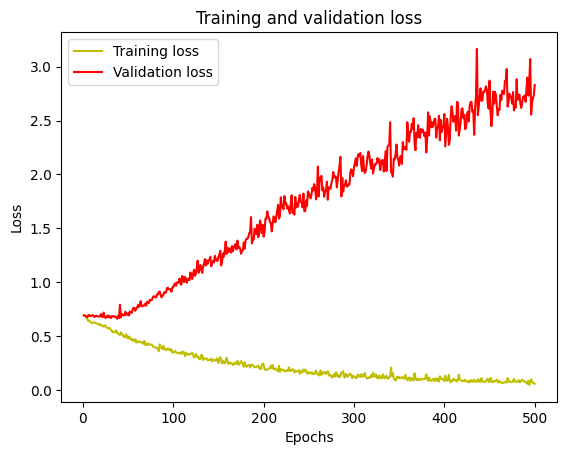

In [21]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

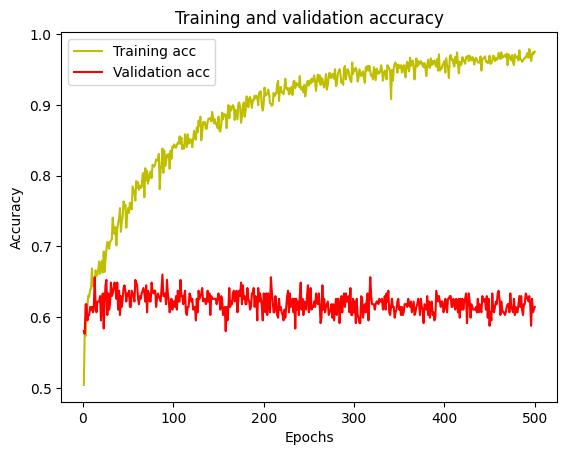

In [22]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [23]:
y_pred = best_model_f1.predict(X_test)
y_pred = (y_pred > 0.5)
print("best_f1:")
eval_model(y_test, y_pred)
y_pred = best_model_accuracy.predict(X_test)
y_pred = (y_pred > 0.5)
print("\nbest_accuracy:")
eval_model(y_test, y_pred)
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5)
print("\nlast epoch model:")
eval_model(y_test, y_pred)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
best_f1:
              precision    recall  f1-score   support

           0       0.63      0.72      0.67       128
           1       0.69      0.60      0.65       134

    accuracy                           0.66       262
   macro avg       0.66      0.66      0.66       262
weighted avg       0.66      0.66      0.66       262

confusion matrix: 
 [[92 36]
 [53 81]]
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

best_accuracy:
              precision    recall  f1-score   support

           0       0.63      0.72      0.67       128
           1       0.69      0.60      0.65       134

    accuracy                           0.66       262
   macro avg       0.66      0.66      0.66       262
weighted avg       0.66      0.66      0.66       262

confusion matrix: 
 [[92 36]
 [53 81]]
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

last epoch model:
              precision    recall  f1-score   support

           0       0.60      0.62      0.61       128
 

# GAN

## models

In [30]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, TensorDataset
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
import torch.nn.functional as F

In [31]:
class Discriminator(nn.Module):
    def __init__(self, in_size, n_channels = 256, dropout_p = 0.2):
      self.dropout_p = dropout_p
      super(Discriminator, self).__init__()
      self.disc = nn.Sequential(
          self._block(in_size, n_channels),
          self._block(n_channels, n_channels),
          self._block(n_channels, n_channels),
          nn.Linear(n_channels, 1)
      )

    def _block(self, in_size, out_size):
        return nn.Sequential(
            nn.Linear(in_size, out_size),
            nn.LeakyReLU(0.2),
            nn.Dropout(self.dropout_p),
        )

    def forward(self, x):
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, in_size, out_size, n_channels = 512):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            self._block(in_size, n_channels),
            self._block(n_channels, n_channels),
            self._block(n_channels, n_channels),
            self._block(n_channels, n_channels),
            nn.Linear(n_channels, out_size),
            nn.Sigmoid()
        )

    def _block(self, in_size, out_size):
        return nn.Sequential(
            nn.Linear(in_size, out_size),
            nn.BatchNorm1d(out_size),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.net(x)
        l1_norm = x.abs().sum(dim=1, keepdim=True) + 1e-8  # Evitar división por cero
        x = x / l1_norm
        return x


def initialize_weights(model):
    # Initializes weights according to the DCGAN paper
    for m in model.modules():
        if isinstance(m, (nn.Linear, nn.BatchNorm1d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)


def test():
    noise_dim, N, feature_size = 100, 5, 160

    x = torch.randn((N, feature_size))
    disc = Discriminator(feature_size)
    assert disc(x).shape == (N, 1), "Discriminator test failed"
    gen = Generator(noise_dim, feature_size)
    z = torch.randn((N, noise_dim))
    assert gen(z).shape == (N, feature_size), "Generator test failed"

#test()

In [32]:
def gradient_penalty(critic, real, fake, device="cpu"):

    BATCH_SIZE, features = real.shape
    alpha = torch.rand((BATCH_SIZE, 1)).repeat(1, features).to(device)
    interpolated_images = real * alpha + fake * (1 - alpha)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

In [33]:
def corr_matrix(x):
    x_centered = x - x.mean(0)
    cov = (x_centered.T @ x_centered) / (x.shape[0] - 1)
    std = x.std(0, unbiased=True)
    corr = cov / (std[:, None] * std[None, :])
    return corr

def correlation_loss(real_batch, fake_batch):

    corr_real = corr_matrix(real_batch)
    corr_fake = corr_matrix(fake_batch)
    return torch.mean((corr_real - corr_fake) ** 2)  # Frobenius norm squared

## dcgan 1d

In [34]:
class DcGenerator(nn.Module):
    def __init__(self, ngf, out_size):
        super(DcGenerator, self).__init__()

        #assert(ngf % 32 == 0 and ngf >= 32)

        self.gen = nn.Sequential(
            self._block(1, ngf, 4, 1, 0, 1),
            self._block(ngf, ngf // 2, 4, 2, 0, 1),
            self._block(ngf // 2, ngf // 4, 4, 2, 0, 1),
            self._block(ngf // 4, ngf // 8, 4, 2, 0, 1),
            self._block(ngf // 8, 1, 10, 2, 0, 1),
            nn.Linear(1684, out_size),
            nn.Tanh(),
        )
    def _block(self, in_channels, out_channels, kernel_size, stride, padding, dilation):
        return nn.Sequential(
            nn.ConvTranspose1d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                dilation=dilation,
                bias=False,
            ),
            nn.BatchNorm1d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x):
        return self.gen(x).squeeze()
    
class DcDiscriminator(nn.Module):
    def __init__(self, ndf, dropout=0.2):
        super(DcDiscriminator, self).__init__()

        self.dropout = dropout

        self.disc = nn.Sequential(
            self._block(1, ndf // 16, 4, 1, 0, 1),
            self._block(ndf // 16, ndf // 8, 4, 2, 0, 1),
            self._block(ndf // 8, ndf // 4, 4, 2, 0, 1),
            self._block(ndf // 4, ndf // 2, 4, 2, 0, 1),
            self._block(ndf // 2, ndf, 4, 2, 0, 1),
            self._block(ndf, 1, 4, 2, 0, 1),
            nn.Linear(10, 1)
        )
    def _block(self, in_channels, out_channels, kernel_size, stride, padding, dilation):
        return nn.Sequential(
            nn.Conv1d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                dilation=dilation,
                bias=False,
            ),
            nn.BatchNorm1d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(self.dropout),
        )
    def forward(self, x):
        return self.disc(x).squeeze()
    
def test():
    noise_dim, N, feature_size = 100, 5, 400

    x = torch.randn((N, 1, feature_size))
    disc = DcDiscriminator(256)
    print(disc(x).shape)
    assert disc(x).shape == (N, ), "Discriminator test failed"

    gen = DcGenerator(512, feature_size)
    z = torch.randn((N, 1, noise_dim))
    print(gen(z).shape)
    assert gen(z).shape == (N, feature_size), "Generator test failed"

test()

torch.Size([5])
torch.Size([5, 400])


## prep

In [26]:
# Hyperparameters etc.
device = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 5e-5
BATCH_SIZE = 128
Z_DIM = 1000
NUM_EPOCHS = 30000
CRITIC_ITERATIONS = 5
LAMBDA_GP = 10
LAMBDA_CORR= 1
#X_gan, y_gan = full_pipeline(merged, "CRC", "species", mapping_df, "norm", "mi", all_disease=False, top_n = 50)
X_gan, y_gan = full_pipeline(merged, "CRC", "species", mapping_df, "norm", all_disease=False)
feature_size = X_gan.shape[1]

In [27]:
device, feature_size

('cpu', 400)

In [28]:
X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.25, random_state=42)

X_train_gan = torch.tensor(X_train_gan.values, dtype=torch.float32)
y_train_gan = torch.tensor(y_train_gan, dtype=torch.float32)

X_test_gan = torch.tensor(X_test_gan.values, dtype=torch.float32)
y_test_gan = torch.tensor(y_test_gan, dtype=torch.float32)

rescale = False

if rescale:
    X_train_gan = X_train_gan*2-1
    X_test_gan = X_test_gan*2-1

In [29]:
# Filtramos para los casos donde y es 1
X_1 = X_train_gan[y_train_gan == 1]
y_1 = y_train_gan[y_train_gan == 1]

# Filtramos para los casos donde y es 0
X_0 = X_train_gan[y_train_gan == 0]
y_0 = y_train_gan[y_train_gan == 0]

dataset_1 = TensorDataset(torch.tensor(X_1, dtype=torch.float32), torch.tensor(y_1))
dataloader_1 = DataLoader(dataset_1, batch_size=BATCH_SIZE, shuffle=True)
dataset_0 = TensorDataset(torch.tensor(X_0, dtype=torch.float32), torch.tensor(y_0))
dataloader_0 = DataLoader(dataset_0, batch_size=BATCH_SIZE, shuffle=True)
dataset = TensorDataset(torch.tensor(X_train_gan, dtype=torch.float32), torch.tensor(y_train_gan))
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

## train

In [35]:
import torch

def compute_correlation_matrix(x):
    x_centered = x - x.mean(0)
    cov = (x_centered.T @ x_centered) / (x.shape[0] - 1)
    std = x.std(0, unbiased=True)
    corr = cov / (std[:, None] * std[None, :])
    return corr
import matplotlib.pyplot as plt

def plot_correlation_comparison(corr_real, generated_data, epoch):
    #corr_real = compute_correlation_matrix(real_data).cpu().detach().numpy()
    corr_fake = compute_correlation_matrix(generated_data).cpu().detach().numpy()

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    axes[0].imshow(corr_real, cmap='coolwarm', vmin=-1, vmax=1)
    axes[0].set_title('Corr Real')
    axes[1].imshow(corr_fake, cmap='coolwarm', vmin=-1, vmax=1)
    axes[1].set_title('Corr Generado')
    plt.suptitle(f'Epoch {epoch}')
    plt.show()

In [36]:
def save_checkpoint(gen, critic, opt_gen, opt_critic, epoch, path):
    checkpoint = {
        "gen_state_dict": gen.state_dict(),
        "critic_state_dict": critic.state_dict(),
        "opt_gen_state_dict": opt_gen.state_dict(),
        "opt_critic_state_dict": opt_critic.state_dict(),
        "epoch": epoch
    }
    torch.save(checkpoint, path)

def load_checkpoint(path, gen, critic, opt_gen, opt_critic):
    checkpoint = torch.load(path)
    gen.load_state_dict(checkpoint["gen_state_dict"])
    critic.load_state_dict(checkpoint["critic_state_dict"])
    opt_gen.load_state_dict(checkpoint["opt_gen_state_dict"])
    opt_critic.load_state_dict(checkpoint["opt_critic_state_dict"])
    start_epoch = checkpoint["epoch"]
    print(f"Checkpoint loaded from {path}, starting from epoch {start_epoch}")
    return start_epoch

def train_wgan(loader, feature_size = feature_size, epochs = NUM_EPOCHS, z_dim = Z_DIM, learning_rate = LEARNING_RATE, disc_hs = 256, gen_hs = 512, cgan = False, num_classes = 2, path = None, checkpoint_path=False, corr_real = None):

  # initialize gen and disc, note: discriminator should be called critic,
  # according to WGAN paper (since it no longer outputs between [0, 1])
  if cgan:
    input_g = z_dim+num_classes
    input_d = feature_size+num_classes
  else:
    input_g = z_dim
    input_d = feature_size
  gen = Generator(input_g, feature_size, gen_hs).to(device)
  critic = Discriminator(input_d, disc_hs).to(device)
  # initialize_weights(gen)
  # initialize_weights(critic)

  # initializate optimizer
  opt_gen = optim.Adam(gen.parameters(), lr=learning_rate, betas=(0.0, 0.9))
  opt_critic = optim.Adam(critic.parameters(), lr=learning_rate, betas=(0.0, 0.9))

  # for tensorboard plotting
  sample_size = 128
  if path is not None:
    writer_real = SummaryWriter(f"runs/{path}/real")
    writer_fake = SummaryWriter(f"runs/{path}/fake")

  # Load checkpoint if provided
  start_epoch = 0
  if checkpoint_path and path is not None:
      start_epoch = load_checkpoint(f"Data/generators/checkpoints/{path}.pth", gen, critic, opt_gen, opt_critic)

  step = 0
  best_loss = float('inf')

  gen.train()
  critic.train()

  for epoch in range(start_epoch, epochs):
        for batch_idx, (real, label) in enumerate(tqdm(loader, disable=True)):
          real = real.to(device)
          cur_batch_size = real.shape[0]
          real_sample = real[:sample_size]

          if cgan:
            encoded_label = F.one_hot(label.long(), num_classes=num_classes).to(device)
            real = torch.cat((real, encoded_label), dim=1)

          # Train Critic: max E[critic(real)] - E[critic(fake)]
          # equivalent to minimizing the negative of that
          for _ in range(CRITIC_ITERATIONS):
              noise = torch.randn(cur_batch_size, z_dim).to(device)
              if cgan:
                noise = torch.cat((noise, encoded_label), dim=1)
              fake = gen(noise)
              if cgan:
                fake = torch.cat((fake, encoded_label), dim=1)
              critic_real = critic(real).reshape(-1)
              critic_fake = critic(fake).reshape(-1)
              gp = gradient_penalty(critic, real, fake, device=device)
              loss_critic = (
                  -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
              )
              critic.zero_grad()
              loss_critic.backward(retain_graph=True)
              opt_critic.step()

          # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
          corr_fake = corr_matrix(fake.detach())
          loss_corr = torch.mean((corr_real - corr_fake) ** 2)
          #loss_corr = correlation_loss(real, fake.detach())
          gen_fake = critic(fake).reshape(-1)
          loss_gen = -torch.mean(gen_fake) + LAMBDA_CORR*loss_corr
          gen.zero_grad()
          loss_gen.backward()
          opt_gen.step()

          if loss_gen.item() < best_loss and path is not None:
            best_loss = loss_gen.item()
            torch.save(gen.state_dict(), f"Data/generators/best_models/{path}.pth")
        if epoch % 1000 == 0 and path is not None:
          print(
              f"Epoch [{epoch}/{epochs}] \
                Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}, loss corr: {loss_corr:.4f}"
          )

          with torch.no_grad():
              fixed_noise = torch.randn(sample_size, z_dim).to(device)
              if cgan:
                fixed_noise_ = torch.cat((fixed_noise, encoded_label[:sample_size]), dim=1)
              else:
                fixed_noise_ = fixed_noise
              fake_sample = gen(fixed_noise_)[:sample_size]
              # take out (up to) sample_size examples
              img_grid_real = torchvision.utils.make_grid(real_sample, normalize=True, nrow=1)
              img_grid_fake = torchvision.utils.make_grid(fake_sample, normalize=True, nrow=1)

              writer_real.add_image("Real", img_grid_real, global_step=step)
              writer_fake.add_image("Fake", img_grid_fake, global_step=step)

              #plot_correlation_comparison(real_sample[:, :50], fake_sample[:, :50], epoch)
              plot_correlation_comparison(corr_real[:50, :50], fake_sample[:, :50], epoch)

          step += 1
          # Save checkpoint at the end of each epoch
          save_checkpoint(gen, critic, opt_gen, opt_critic, epoch, f"Data/generators/checkpoints/{path}.pth")
  return gen

## label 0

In [38]:
!rm -rf runs/gan_0
%load_ext tensorboard
%tensorboard --logdir runs/gan_0

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 10643), started 0:00:01 ago. (Use '!kill 10643' to kill it.)

Epoch [0/30000]                 Loss D: 7.6500, loss G: 0.0353, loss corr: 0.0222


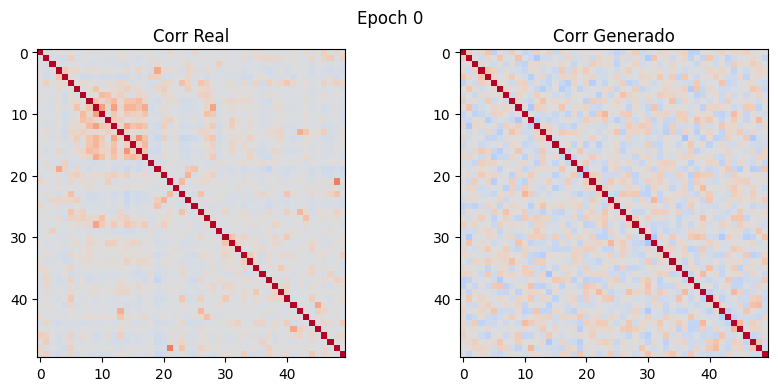

Epoch [1000/30000]                 Loss D: 0.0199, loss G: 0.2396, loss corr: 0.1348


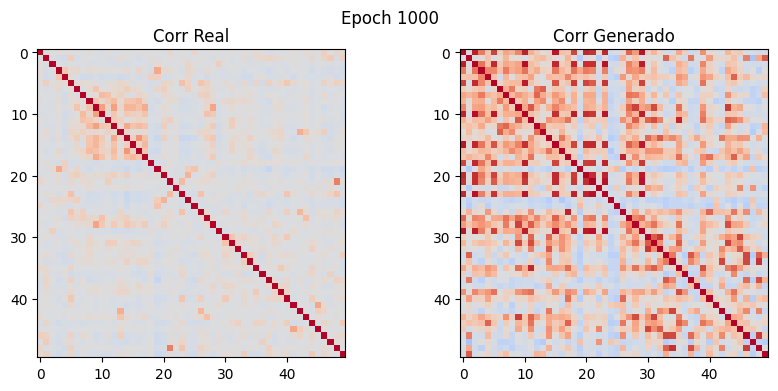

Epoch [2000/30000]                 Loss D: 0.0050, loss G: 0.3761, loss corr: 0.0510


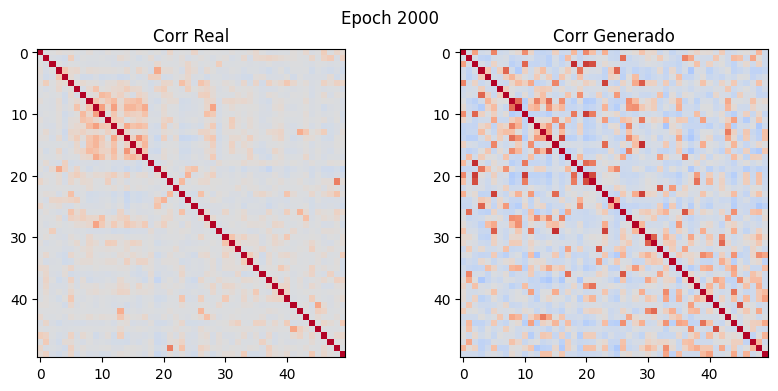

In [ ]:
corr_real = corr_matrix(dataset_0[:][0])
gen_0 = train_wgan(dataloader_0, path = "gan_0", corr_real=corr_real)
gen_0.eval()

In [46]:
torch.save(gen_0.state_dict(), 'Data/generators/gen_0_corr_10_epoch_30000_neuron_1024.pth')

if already exist a model

In [39]:
gen_0 = Generator(Z_DIM, feature_size)

# Carga segura del modelo en CPU
checkpoint = torch.load('Data/generators/gen_0_corr_epoch_20000.pth',
                        map_location=torch.device(device),
                        weights_only=True)

gen_0.load_state_dict(checkpoint)
gen_0.eval()

Generator(
  (net): Sequential(
    (0): Sequential(
      (0): Linear(in_features=500, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): Linear(in_features=512, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Linear(in_features=512, out_features=400, bias=True)
    (4): Sigmoid()
  )
)

In [47]:
noise_vector = torch.randn(500, Z_DIM).to(device)
with torch.no_grad():
    simulated_data_set_0 = gen_0(noise_vector)

In [168]:
#Total of 500 simulated data label 0
pd.DataFrame(
    simulated_data_set_0.cpu().numpy()
).to_csv("Data/dataset/simulated_0_corr_10_epoch_30000_2000.csv", sep=",", index=False, encoding="utf-8")


visualize

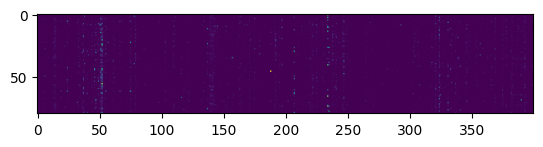

In [48]:
# Fake Data
plt.imshow(simulated_data_set_0[80:160].cpu().numpy())

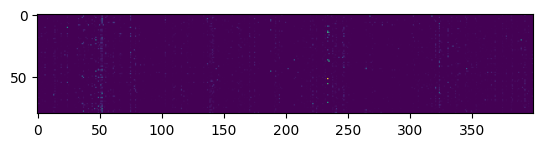

In [49]:
#Real Data
plt.imshow(dataset_0[80:160][0])

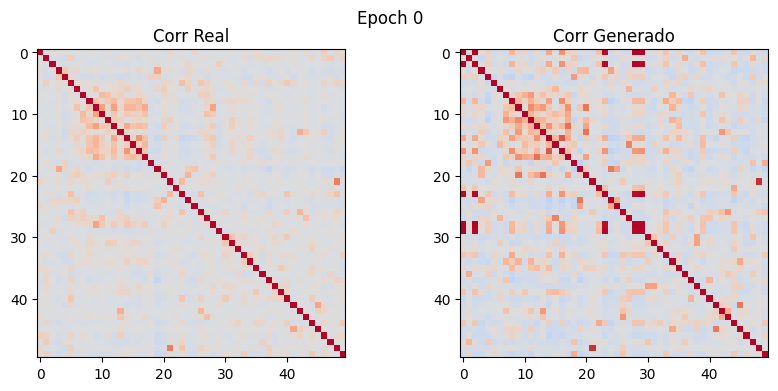

In [50]:
plot_correlation_comparison(dataset_0[:][0][:, :50], simulated_data_set_0[:][:, :50], 0)

## label 1

In [40]:
!rm -rf runs/gan_1
%load_ext tensorboard
%tensorboard --logdir runs/gan_1

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 45282), started 0:00:02 ago. (Use '!kill 45282' to kill it.)

Epoch [0/30000]                 Loss D: 9.5085, loss G: 0.0535, loss corr: 0.0313


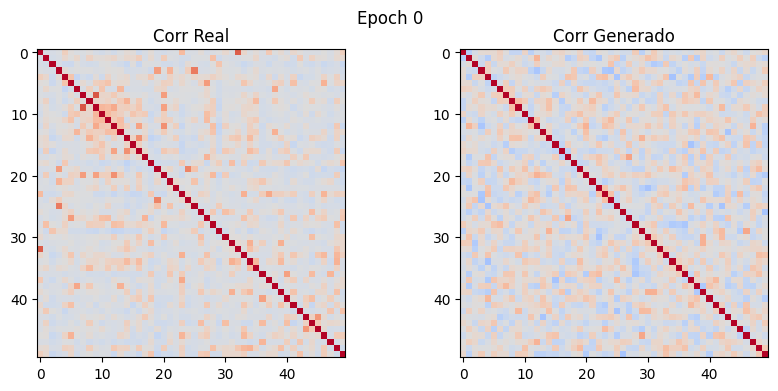

Epoch [1000/30000]                 Loss D: 0.0372, loss G: 0.8312, loss corr: 0.6018


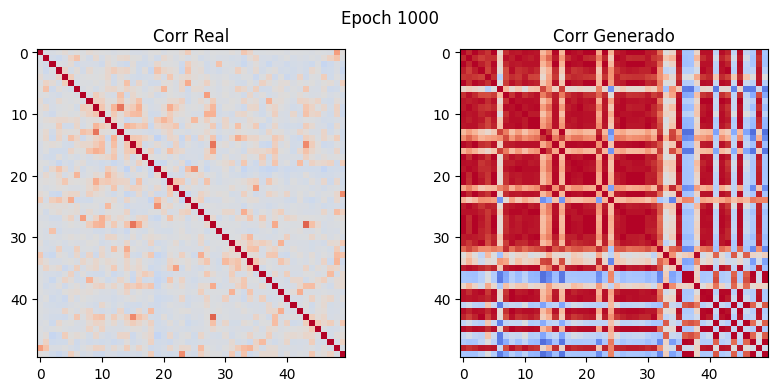

Epoch [2000/30000]                 Loss D: 0.0173, loss G: 0.5051, loss corr: 0.2969


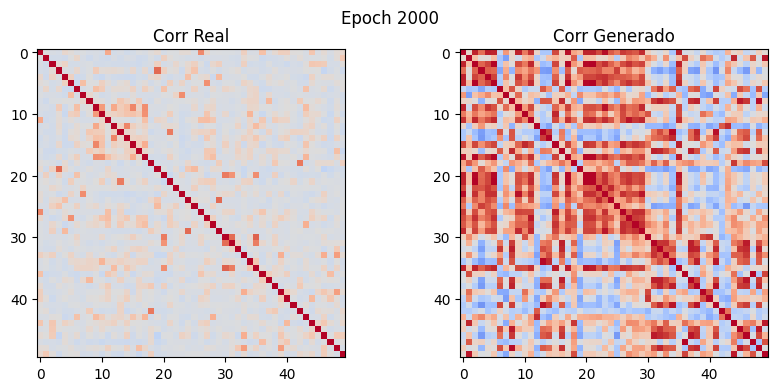

Epoch [3000/30000]                 Loss D: 0.0206, loss G: 0.3351, loss corr: 0.1907


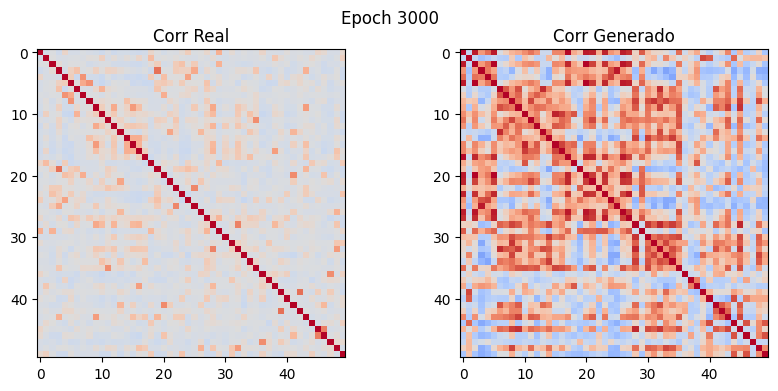

Epoch [4000/30000]                 Loss D: 0.0357, loss G: 0.2344, loss corr: 0.1257


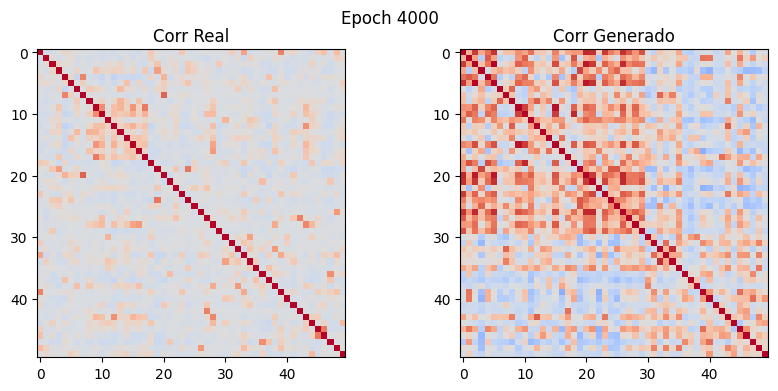

Epoch [5000/30000]                 Loss D: -0.0019, loss G: 0.1431, loss corr: 0.0903


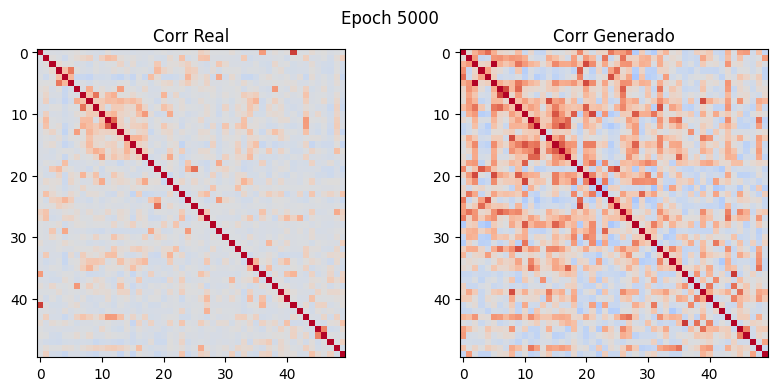

Epoch [6000/30000]                 Loss D: 0.0468, loss G: 0.0129, loss corr: 0.0864


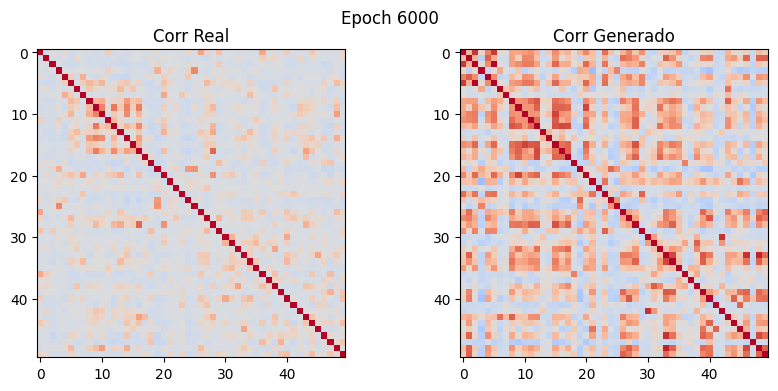

Epoch [7000/30000]                 Loss D: 0.0335, loss G: -0.0350, loss corr: 0.0667


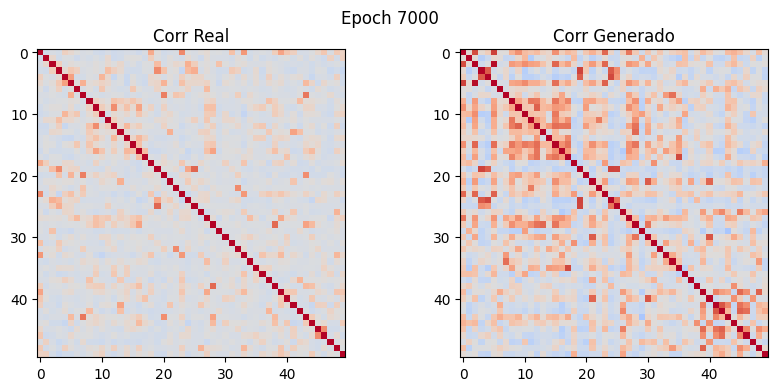

Epoch [8000/30000]                 Loss D: -0.0015, loss G: 0.0715, loss corr: 0.0513


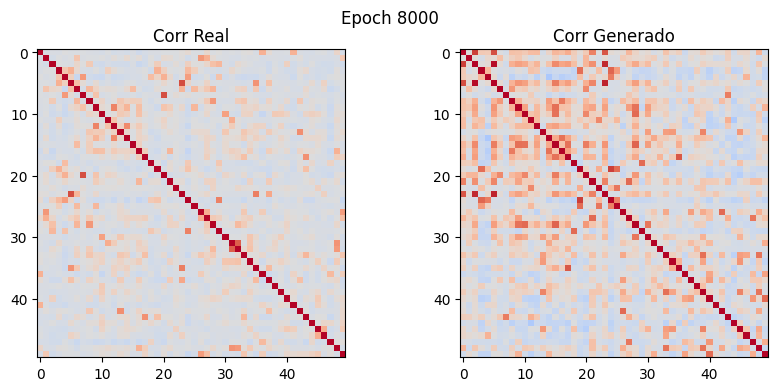

Epoch [9000/30000]                 Loss D: 0.0209, loss G: 0.0781, loss corr: 0.0483


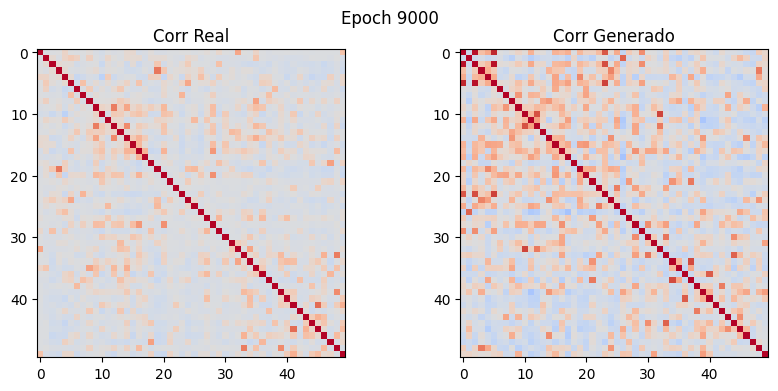

Epoch [10000/30000]                 Loss D: -0.0025, loss G: 0.1322, loss corr: 0.0437


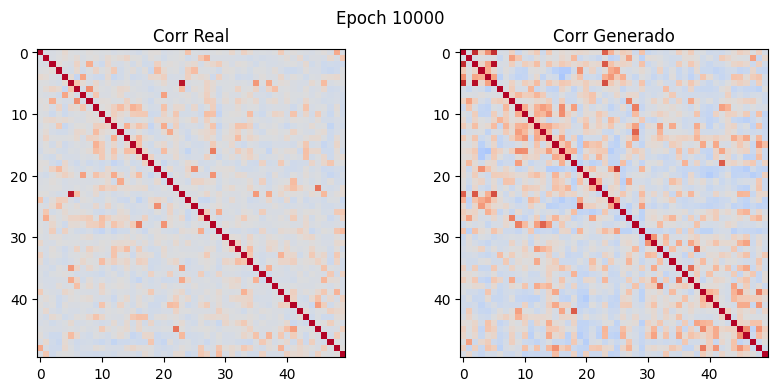

Epoch [11000/30000]                 Loss D: -0.0154, loss G: 0.1844, loss corr: 0.0428


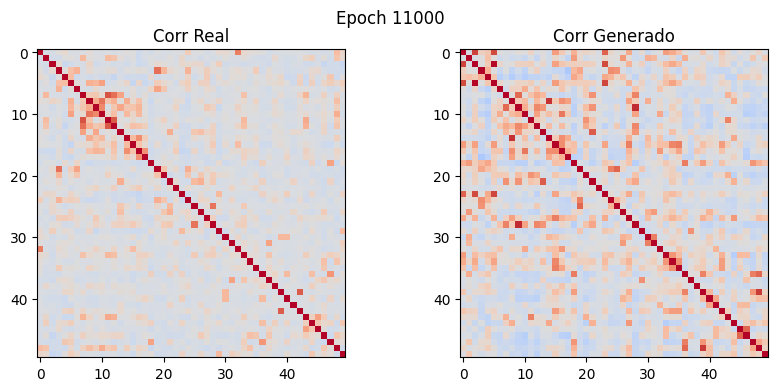

Epoch [12000/30000]                 Loss D: -0.0265, loss G: 0.1009, loss corr: 0.0400


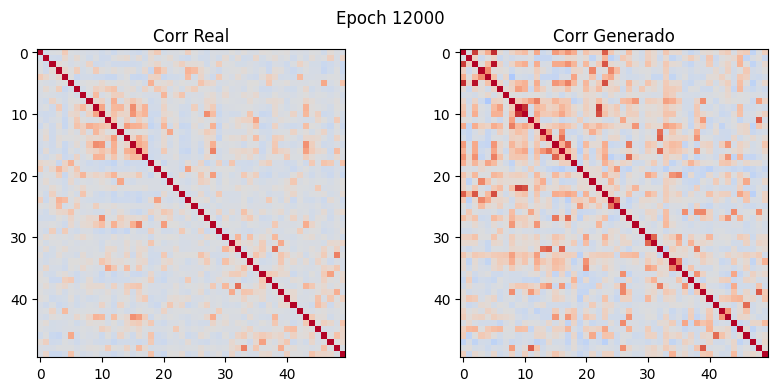

Epoch [13000/30000]                 Loss D: -0.0183, loss G: 0.1834, loss corr: 0.0384


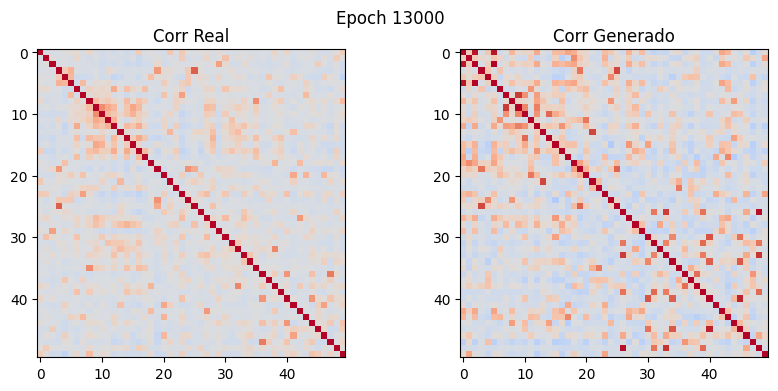

Epoch [14000/30000]                 Loss D: 0.0067, loss G: 0.2002, loss corr: 0.0353


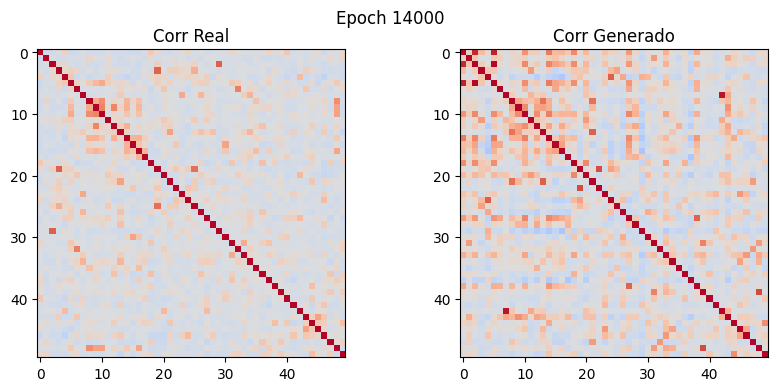

Epoch [15000/30000]                 Loss D: 0.0013, loss G: 0.1799, loss corr: 0.0388


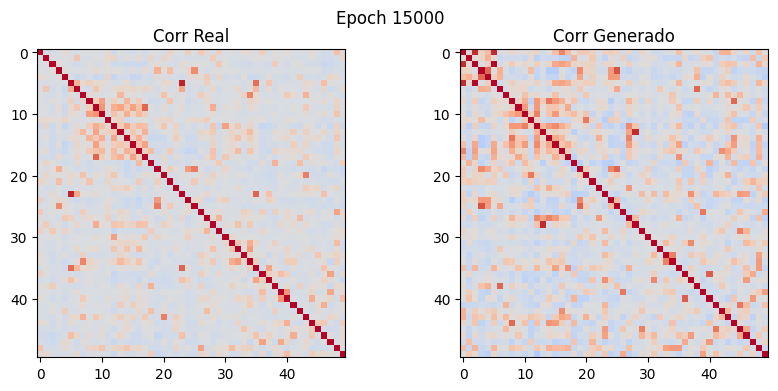

Epoch [16000/30000]                 Loss D: 0.0306, loss G: 0.2362, loss corr: 0.0341


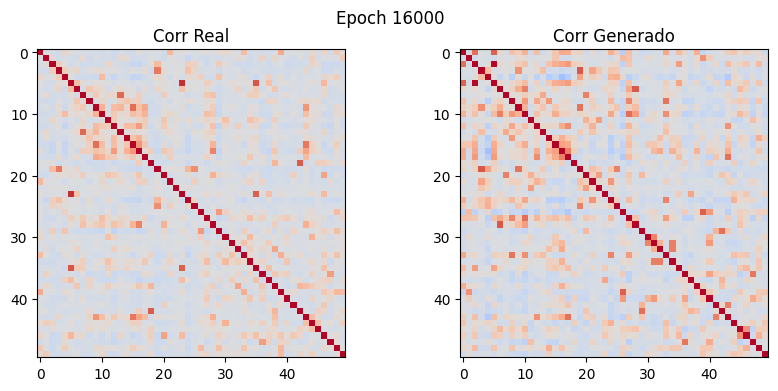

Epoch [17000/30000]                 Loss D: 0.0076, loss G: 0.1313, loss corr: 0.0316


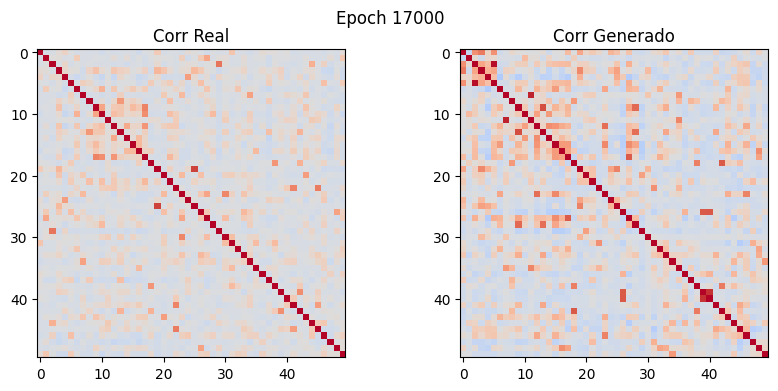

Epoch [18000/30000]                 Loss D: 0.0197, loss G: 0.1537, loss corr: 0.0324


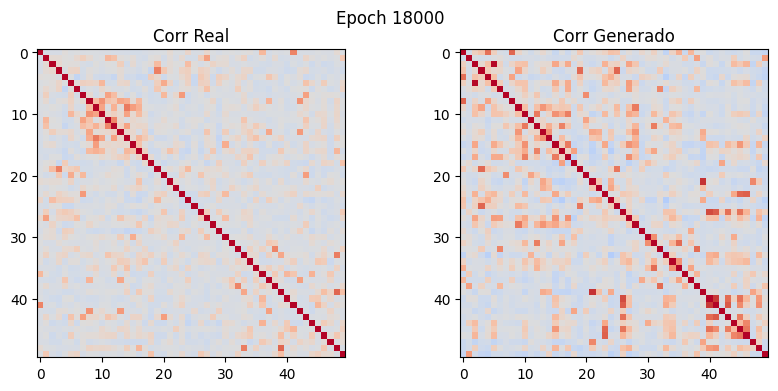

Epoch [19000/30000]                 Loss D: -0.0080, loss G: 0.1576, loss corr: 0.0319


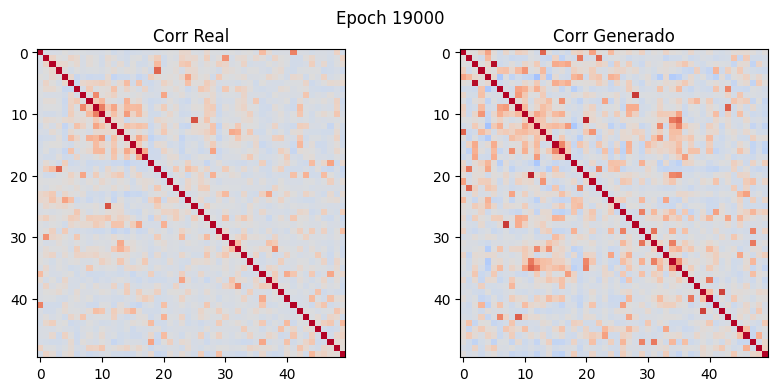

Epoch [20000/30000]                 Loss D: 0.0164, loss G: 0.1091, loss corr: 0.0308


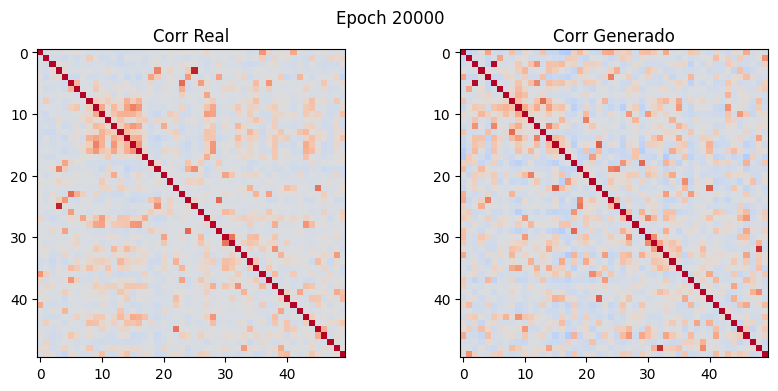

Epoch [21000/30000]                 Loss D: 0.0246, loss G: 0.1003, loss corr: 0.0291


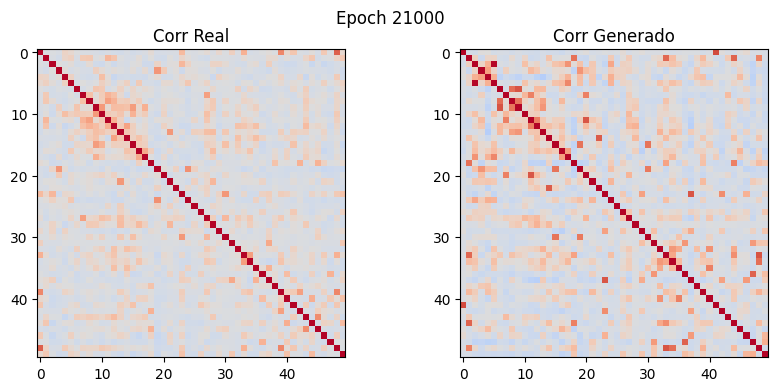

Epoch [22000/30000]                 Loss D: 0.0245, loss G: 0.1859, loss corr: 0.0286


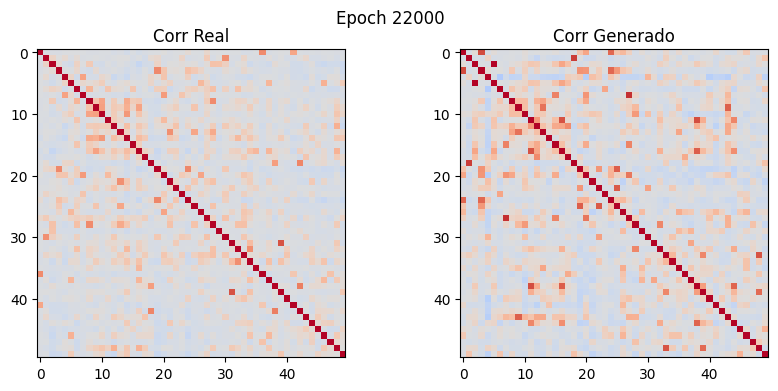

Epoch [23000/30000]                 Loss D: 0.0136, loss G: 0.1414, loss corr: 0.0285


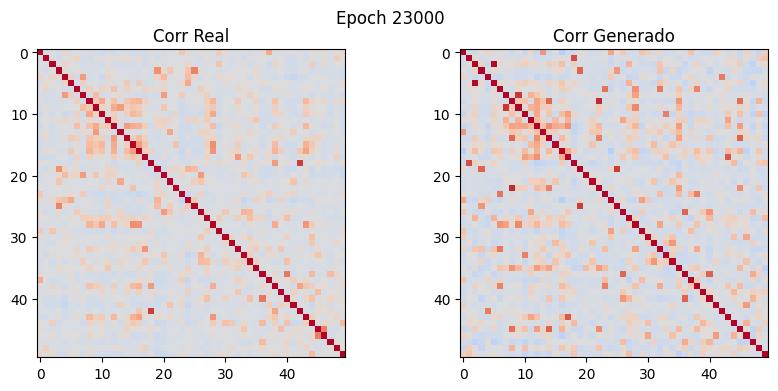

Epoch [24000/30000]                 Loss D: -0.0311, loss G: 0.2124, loss corr: 0.0285


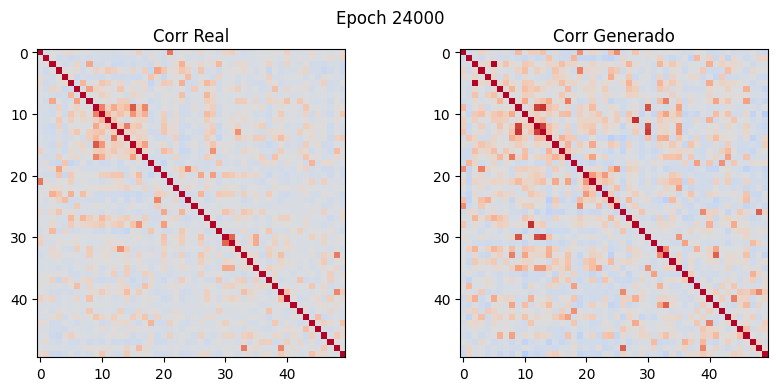

Epoch [25000/30000]                 Loss D: 0.0120, loss G: 0.1729, loss corr: 0.0286


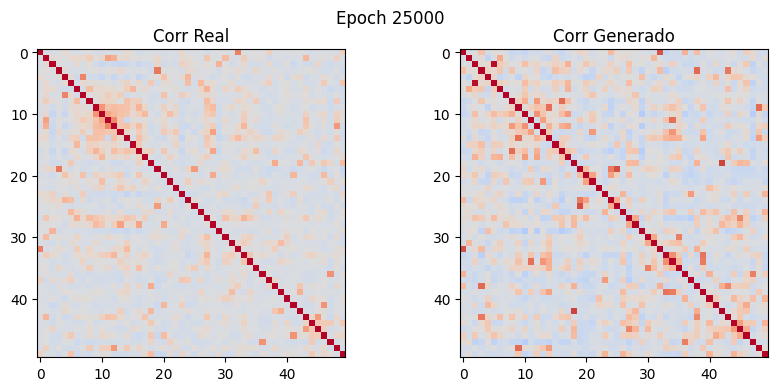

Epoch [26000/30000]                 Loss D: -0.0127, loss G: 0.1807, loss corr: 0.0291


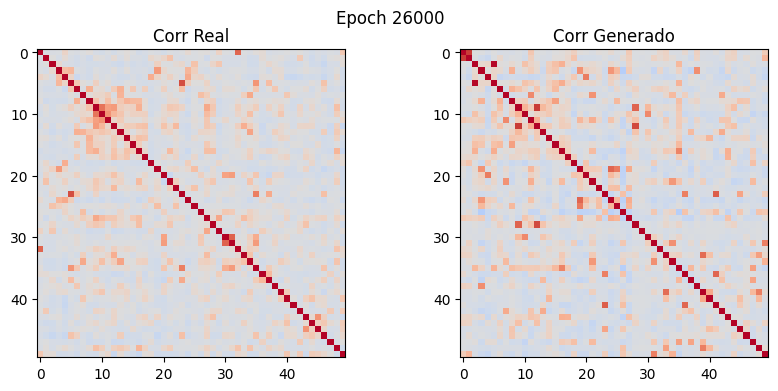

Epoch [27000/30000]                 Loss D: 0.0163, loss G: 0.1346, loss corr: 0.0287


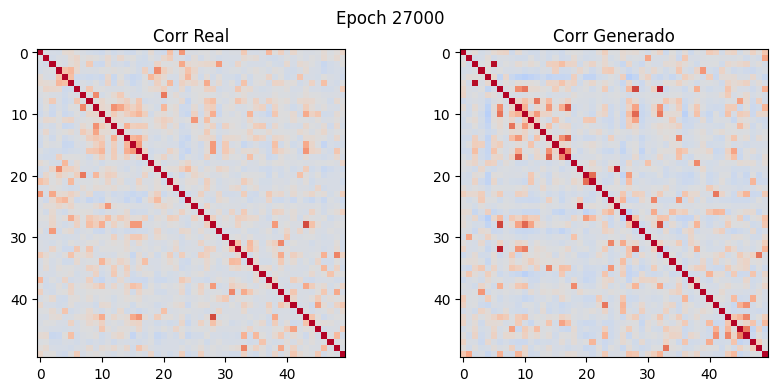

Epoch [28000/30000]                 Loss D: 0.0260, loss G: 0.1804, loss corr: 0.0265


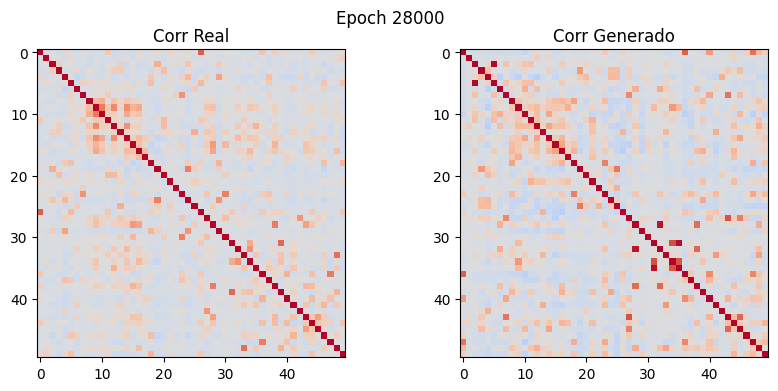

Epoch [29000/30000]                 Loss D: 0.0231, loss G: 0.2031, loss corr: 0.0282


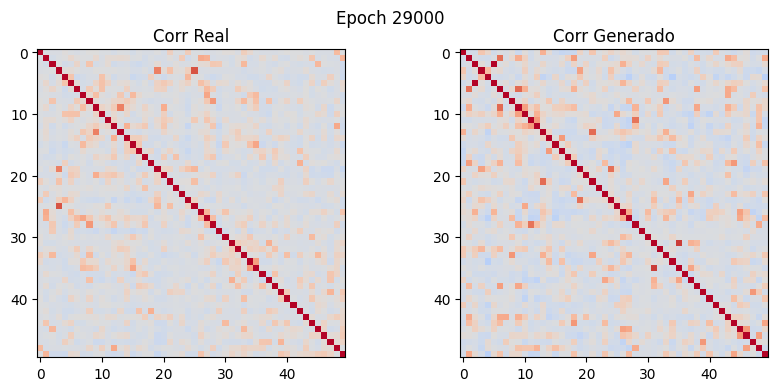

Generator(
  (net): Sequential(
    (0): Sequential(
      (0): Linear(in_features=1000, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): Linear(in_features=512, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Linear(in_features=512, out_features=400, bias=True)
    (4): Sigmoid()
  )
)

In [104]:
gen_1 = train_wgan(dataloader_1, path = "gan_1")
gen_1.eval()

In [105]:
torch.save(gen_1.state_dict(), 'Data/generators/gen_1_corr_10_epoch_30000.pth')

if already exist a model

In [ ]:
gen_1 = Generator(Z_DIM, feature_size)

# Carga segura del modelo en CPU
checkpoint = torch.load('Data/generators/gen_1.pth',
                        map_location=torch.device(device),
                        weights_only=True)

gen_1.load_state_dict(checkpoint)
gen_1.eval()

Generator(
  (net): Sequential(
    (0): Sequential(
      (0): Linear(in_features=100, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): Linear(in_features=512, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Linear(in_features=512, out_features=686, bias=True)
    (4): Softmax(dim=1)
  )
)

In [169]:
noise_vector = torch.randn(2000, Z_DIM).to(device)
with torch.no_grad():
    simulated_data_set_1 = gen_1(noise_vector)

In [170]:
#Total of 500 simulated data label 1
pd.DataFrame(
    simulated_data_set_1.cpu().numpy()
).to_csv("Data/dataset/simulated_1_corr_10_epoch_30000_2000.csv", sep=",", index=False, encoding="utf-8")

visualize

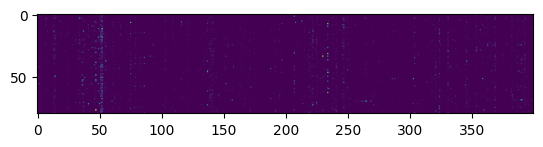

In [108]:
# Fake Data
plt.imshow(simulated_data_set_1[80:160].cpu().numpy())

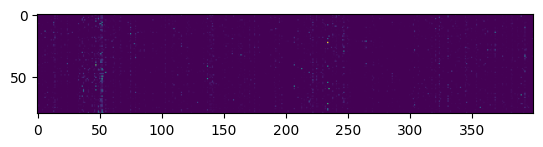

In [109]:
#Real Data
plt.imshow(dataset_1[80:160][0])

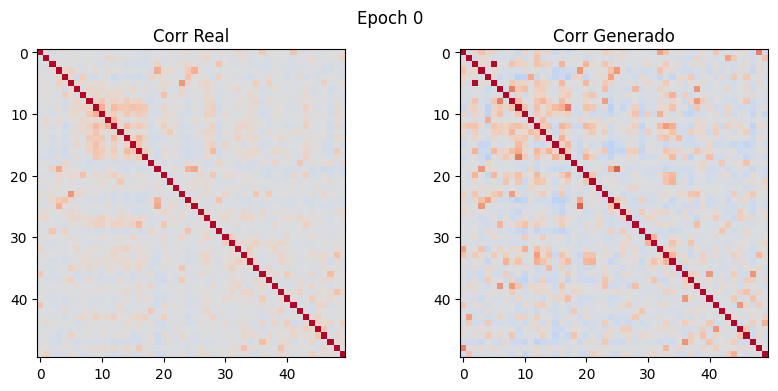

In [110]:
plot_correlation_comparison(dataset_1[:][0][:, :50], simulated_data_set_1[:][:, :50], 0)

## CGAN

In [24]:
!rm -rf runs/cgan
%reload_ext tensorboard
%tensorboard --logdir runs/cgan

Reusing TensorBoard on port 6006 (pid 48990), started 0:00:02 ago. (Use '!kill 48990' to kill it.)

In [25]:
num_classes = 2

In [ ]:
c_gen = train_wgan(dataloader, cgan=True, num_classes=num_classes, path = "cgan")
c_gen.eval()

In [244]:
torch.save(c_gen.state_dict(), 'Data/generators/c_gen_LC.pth')

if already exist a model

In [27]:
c_gen = Generator(Z_DIM+num_classes, feature_size)

# Carga segura del modelo en CPU
checkpoint = torch.load('Data/generators/c_gen_epoch_10.pth',
                        map_location=torch.device(device),
                        weights_only=True)

c_gen.load_state_dict(checkpoint)
c_gen.eval()

Generator(
  (net): Sequential(
    (0): Sequential(
      (0): Linear(in_features=102, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): Linear(in_features=512, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Linear(in_features=512, out_features=686, bias=True)
    (4): Softmax(dim=1)
  )
)

In [245]:
data_size = 100

noise_vector_1 = torch.randn(data_size, Z_DIM).to(device)
noise_vector_0 = torch.randn(data_size, Z_DIM).to(device)

ones_encoded = F.one_hot(torch.ones(data_size).long(), num_classes=num_classes).to(device)
zeros_encoded = F.one_hot(torch.zeros(data_size).long(), num_classes=num_classes).to(device)

with torch.no_grad():
    simulated_data_set_1_cgan = c_gen(torch.cat((noise_vector_1, ones_encoded), dim = 1))
    simulated_data_set_0_cgan = c_gen(torch.cat((noise_vector_0, zeros_encoded), dim = 1))

In [259]:
pd.DataFrame(
    simulated_data_set_1_cgan.cpu().numpy()
).to_csv(f"Data/dataset/simulated_1_cgan_T1D.csv", sep=",", index=False, encoding="utf-8")
pd.DataFrame(
    simulated_data_set_0_cgan.cpu().numpy()
).to_csv(f"Data/dataset/simulated_0_cgan_T1D.csv", sep=",", index=False, encoding="utf-8")

visualize

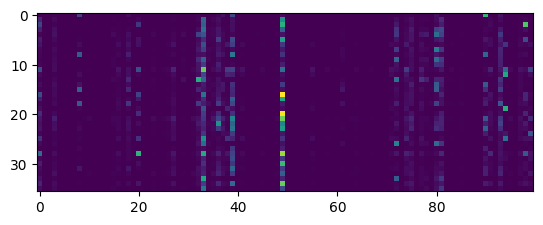

In [258]:
# Fake Data
plt.imshow(simulated_data_set_0_cgan[:36].cpu().numpy())

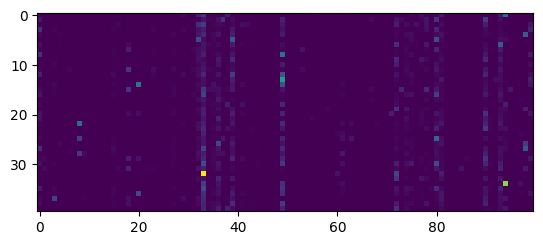

In [255]:
#Real Data
plt.imshow(dataset_0[:300][0])

## hyperparameter tunning

In [23]:
def objective(trial):
    #hyperparameters
    disc_hidden_size = trial.suggest_int('hidden_size_disc', 128, 512)
    gen_hidden_size = trial.suggest_int('hidden_size_gen', 128, 512)
    learning_rate = trial.suggest_float('lr', 5e-5, 1e-3)
    z_dim = trial.suggest_int('z_dim', 50, 100)
    epochs = trial.suggest_int('epochs', 2000, 6000)
    fs = trial.suggest_categorical('fs', ['mi', 'rf'])
    feature_size = trial.suggest_int('feature_size', 50, 600)
    sim_data_size = trial.suggest_int('sim_data_size', 700, 2000)
    
    X_gan, y_gan = full_pipeline(merged, "CRC", "species", mapping_df, "norm", fs, all_disease=False, top_n = feature_size)
    
    X_train_gan, X_test_gan, y_train_gan, y_test_gan = train_test_split(X_gan, y_gan, test_size=0.25, random_state=42)

    X_train_gan = torch.tensor(X_train_gan.to_numpy(), dtype=torch.float32)
    y_train_gan = torch.tensor(y_train_gan, dtype=torch.float32)

    X_test_gan = X_test_gan.to_numpy()

    # Filtramos para los casos donde y es 1
    X_1 = X_train_gan[y_train_gan == 1]
    y_1 = y_train_gan[y_train_gan == 1]

    # Filtramos para los casos donde y es 0
    X_0 = X_train_gan[y_train_gan == 0]
    y_0 = y_train_gan[y_train_gan == 0]

    dataset_1 = TensorDataset(torch.tensor(X_1, dtype=torch.float32), torch.tensor(y_1))
    dataloader_1 = DataLoader(dataset_1, batch_size=BATCH_SIZE, shuffle=True)
    dataset_0 = TensorDataset(torch.tensor(X_0, dtype=torch.float32), torch.tensor(y_0))
    dataloader_0 = DataLoader(dataset_0, batch_size=BATCH_SIZE, shuffle=True)

    gen_0 = train_wgan(dataloader_0, feature_size, epochs, z_dim, learning_rate, disc_hidden_size, gen_hidden_size)
    gen_0.eval()
    noise_vector = torch.randn(sim_data_size, z_dim).to(device)
    with torch.no_grad():
        simulated_data_set_0 = gen_0(noise_vector)

    gen_1 = train_wgan(dataloader_1, feature_size, epochs, z_dim, learning_rate, disc_hidden_size, gen_hidden_size)
    gen_1.eval()
    noise_vector = torch.randn(sim_data_size, z_dim).to(device)
    with torch.no_grad():
        simulated_data_set_1 = gen_1(noise_vector)

    simulated_x = np.concatenate((simulated_data_set_1.cpu().numpy(), simulated_data_set_0.cpu().numpy()), axis=0)
    simulated_y = np.concatenate((np.ones(sim_data_size), np.zeros(sim_data_size)), axis=0).astype(np.float32)
    simulated_x, simulated_y = shuffle(simulated_x, simulated_y, random_state=42)

    X_train_simulated = np.concatenate((X_train_gan.numpy(), simulated_x), axis=0)
    y_train_simulated = np.concatenate((y_train_gan.numpy(), simulated_y), axis=0)
    X_train_simulated, y_train_simulated = shuffle(X_train_simulated, y_train_simulated, random_state=42)

    # params = {
    #     "max_depth": trial.suggest_int("max_depth", 3, 18),
    #     "gamma": trial.suggest_float("gamma", 1, 9),
    #     "reg_alpha": trial.suggest_int("reg_alpha", 40, 180),
    #     "reg_lambda": trial.suggest_float("reg_lambda", 0, 1),
    #     "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1),
    #     "min_child_weight": trial.suggest_int("min_child_weight", 0, 10),
    #     "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
    # }

    # # Entrenamiento del modelo con XGBoost
    # model = XGBClassifier(**params, use_label_encoder=False)
    # model.fit(X_train_simulated, y_train_simulated, eval_set=[(X_test_gan, y_test_gan)], early_stopping_rounds=10, verbose=False)

    model = XGBClassifier(eval_metric='mlogloss')
    model.fit(X_train_simulated, y_train_simulated)
    pred = model.predict(X_test_gan)
    accuracy = accuracy_score(y_test_gan, pred)
    return accuracy

In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

best_params = study.best_params
best_score = study.best_value

best_params_with_score = {
    "best_params": best_params,
    "best_score": best_score
}

with open("gan_params/best_params.json", "w") as f:
    json.dump(best_params_with_score, f, indent=4)

print(f"Mejores parámetros guardados en 'best_params.json': {best_params_with_score}")

## load simulated datasets

In [171]:
simulated_df_0 = pd.read_csv(f"Data/dataset/simulated_0_corr_10_epoch_30000_2000.csv")
simulated_df_1 = pd.read_csv(f"Data/dataset/simulated_1_corr_10_epoch_30000_2000.csv")
# simulated_df_0.columns = X_gan.columns
# simulated_df_1.columns = X_gan.columns

simulated_x = np.concatenate((simulated_df_1.to_numpy(), simulated_df_0.to_numpy()), axis=0)
simulated_y = np.concatenate((np.ones(simulated_df_1.shape[0]), np.zeros(simulated_df_0.shape[0])), axis=0).astype(np.float32)
simulated_x, simulated_y = shuffle(simulated_x, simulated_y, random_state=42)

In [172]:
simulated_x.shape, simulated_y.shape

((4000, 400), (4000,))

## ydata-profing

In [27]:
mi_columns_disease = list(feature_selection_pipeline(X_gan, pd.Series(y_gan), "mi", top_n=50))+["Disease"]

In [29]:
original_df = pd.DataFrame(np.concatenate((X_gan.to_numpy(), y_gan.reshape(-1,1)), axis=1), columns=list(X_gan.columns)+["Disease"])[mi_columns_disease]
simulated_df = pd.DataFrame(np.concatenate((simulated_x, simulated_y.reshape(-1,1)), axis=1), columns=list(X_gan.columns)+["Disease"])[mi_columns_disease]
original_df.shape, simulated_df.shape

((1307, 51), (2000, 51))

In [30]:
profile_org = ProfileReport(original_df, title="original")
profile_org.to_file("profiles/original.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


In [31]:
profile_sim = ProfileReport(simulated_df, title="simulated")
profile_sim.to_file("profiles/simulated.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]


## diversity evaluation

In [23]:
from skbio.diversity import alpha_diversity, beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import permanova
from scipy.stats import ttest_ind, wilcoxon

In [25]:
def alpha_data_select(real, simulated, method="shannon"):
    
  real_div, simul_div = alpha_diversity(method, real), alpha_diversity(method, simulated)

  Q1 = np.percentile(real_div, 25)  # Primer cuartil
  Q3 = np.percentile(real_div, 75)  # Tercer cuartil
  
  # Calcular el rango intercuartílico (IQR)
  IQR = Q3 - Q1

  # Calcular los límites para detectar outliers
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  # Filtrar los datos dentro del rango permitido
  return simulated[(simul_div >= lower_bound) & (simul_div <= upper_bound)]

select by alpha diversity

In [ ]:
simulated_0_selected = alpha_data_select(X_0.numpy(), simulated_df_0.to_numpy())
simulated_1_selected = alpha_data_select(X_1.numpy(), simulated_df_1.to_numpy())


simulated_x = np.concatenate((simulated_1_selected, simulated_0_selected), axis=0)
simulated_y = np.concatenate((np.ones(simulated_1_selected.shape[0]), np.zeros(simulated_0_selected.shape[0])), axis=0).astype(np.float32)
simulated_x, simulated_y = shuffle(simulated_x, simulated_y, random_state=42)
simulated_x.shape

eval diversity

In [26]:
def alpha_eval(real, simulated, method = "shannon"):

  real = real/real.sum(axis=1, keepdims=True)
  simulated = simulated/simulated.sum(axis=1, keepdims=True)

  real_div, simul_div = alpha_diversity(method, real), alpha_diversity(method, simulated)

  # Crear un DataFrame para visualización
  diversity_df = pd.DataFrame({
      'Diversity': np.concatenate([real_div, simul_div]),
      'Type': ['Real'] * len(real_div) + ['Simulated'] * len(simul_div)
  })

  print(f"Diversidad alfa (Shannon) - Datos reales: {np.mean(real_div):.2f} ± {np.std(real_div):.2f}")
  print(f"Diversidad alfa (Shannon) - Datos simulados: {np.mean(simul_div):.2f} ± {np.std(simul_div):.2f}")

  # Boxplot
  sns.boxplot(x='Type', y='Diversity', data=diversity_df)
  plt.title('Comparación de Diversidad Alfa (Shannon)')
  plt.show()

def beta_eval(real, simulated, method = "braycurtis"):
  # Combinar los datos
  abundance_combined = np.concatenate((real, simulated), axis = 0)
  sample_labels = ['Real'] * len(real) + ['Simulated'] * len(simulated)

  dist_matrix = beta_diversity(method, abundance_combined)

  # Perform PCoA
  ordination = pcoa(dist_matrix)

  # Visualización de PCoA
  ordination_df = ordination.samples
  ordination_df['Type'] = sample_labels

  sns.scatterplot(x=ordination_df['PC1'], y=ordination_df['PC2'], hue=ordination_df['Type'], palette="Set2")
  plt.title('Proyección PCoA (Beta Diversity)')
  plt.xlabel(f"PC1 ({ordination.proportion_explained[0]*100:.1f}%)")
  plt.ylabel(f"PC2 ({ordination.proportion_explained[1]*100:.1f}%)")
  plt.legend(title='Grupo')
  plt.show()

  # 4. Comparar estadísticamente con PERMANOVA
  permanova_result = permanova(dist_matrix, grouping=sample_labels)
  print(permanova_result)
  print(f"PERMANOVA: Estadístico={permanova_result['test statistic']:.2f}, p-valor={permanova_result['p-value']:.3f}")

Diversidad alfa (Shannon) - Datos reales: 3.54 ± 0.60
Diversidad alfa (Shannon) - Datos simulados: 3.81 ± 0.64


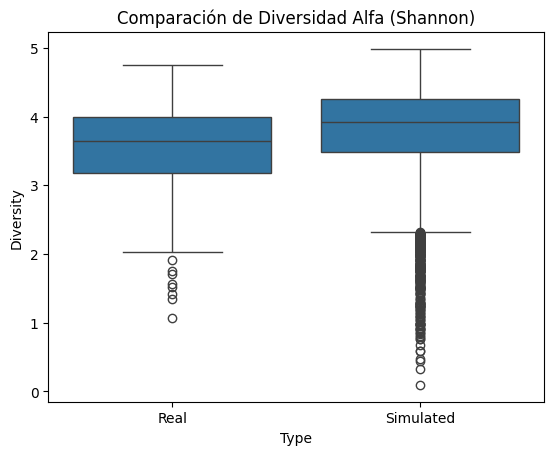

In [32]:
alpha_eval(X_0.numpy(), simulated_df_0.to_numpy())

Diversidad alfa (Shannon) - Datos reales: 2.25 ± 0.54
Diversidad alfa (Shannon) - Datos simulados: 2.48 ± 0.51


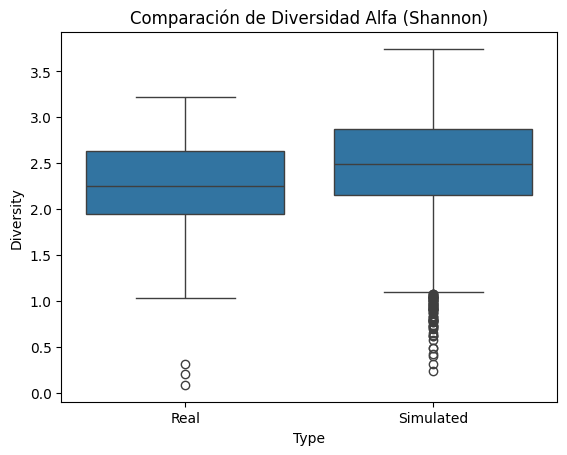

In [82]:
alpha_eval(X_1.numpy(), simulated_df_1.values)

/home/gyuhee/Documents/bioinformatics/atlas/micro_atlas/env/lib/python3.11/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:146: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -2.1683686049321644 and the largest is 50.06884224317109.
  warn(
/tmp/ipykernel_47838/506075773.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f"PC1 ({ordination.proportion_explained[0]*100:.1f}%)")
/tmp/ipykernel_47838/506075773.py:39: FutureWarning: Series.__getitem__ treating keys as p

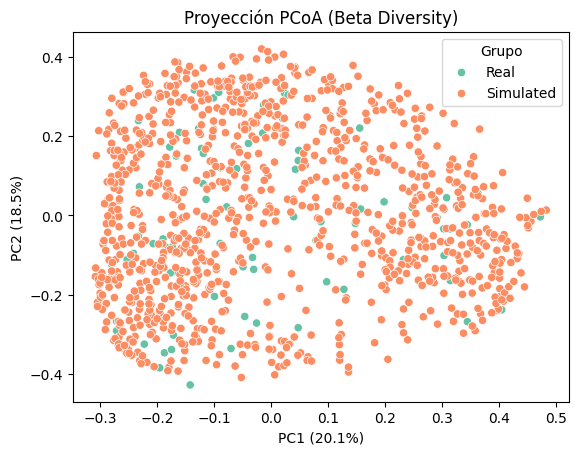

method name               PERMANOVA
test statistic name        pseudo-F
sample size                    1081
number of groups                  2
test statistic             4.332291
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object
PERMANOVA: Estadístico=4.33, p-valor=0.001


In [83]:
beta_eval(X_0.numpy(), simulated_df_0.values[:1000])

/home/gyuhee/Documents/bioinformatics/atlas/micro_atlas/env/lib/python3.11/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:146: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -1.9386629166026852 and the largest is 60.06272769327456.
  warn(
/tmp/ipykernel_47838/506075773.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f"PC1 ({ordination.proportion_explained[0]*100:.1f}%)")
/tmp/ipykernel_47838/506075773.py:39: FutureWarning: Series.__getitem__ treating keys as p

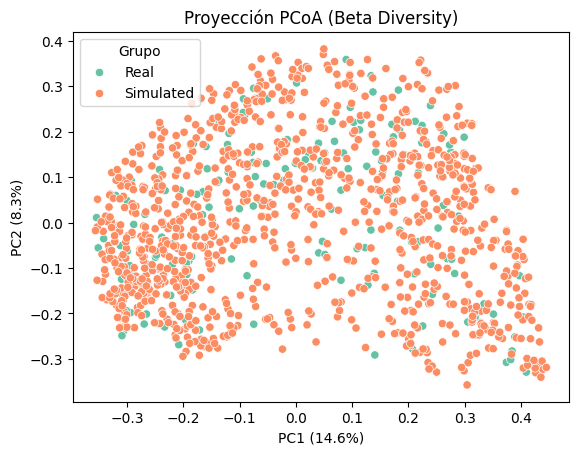

method name               PERMANOVA
test statistic name        pseudo-F
sample size                    1164
number of groups                  2
test statistic             5.070545
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object
PERMANOVA: Estadístico=5.07, p-valor=0.001


In [84]:
beta_eval(X_1.numpy(), simulated_df_1.values[:1000])

## Testing GAN

In [173]:
X_train_simulated = np.concatenate((X_train_gan.numpy(), simulated_x), axis=0)
y_train_simulated = np.concatenate((y_train_gan.numpy(), simulated_y), axis=0)
X_train_simulated, y_train_simulated = shuffle(X_train_simulated, y_train_simulated, random_state=42)

In [174]:
X_train_simulated_df = pd.DataFrame(X_train_simulated, columns=X_gan.columns)
X_train_gan_df = pd.DataFrame(X_train_gan, columns=X_gan.columns)

rf_columns = feature_selection_pipeline(X_train_simulated_df, pd.Series(y_train_simulated), "rf", top_n=100)
mi_columns = feature_selection_pipeline(X_train_simulated_df, pd.Series(y_train_simulated), "mi", top_n=100)
kruskal_columns = feature_selection_pipeline(X_train_simulated_df, pd.Series(y_train_simulated), "kruskal")
fs_columns = mi_columns

rf_columns = feature_selection_pipeline(X_train_gan_df, pd.Series(y_train_gan), "rf", top_n=100)
mi_columns = feature_selection_pipeline(X_train_gan_df, pd.Series(y_train_gan), "mi", top_n=100)
kruskal_columns = feature_selection_pipeline(X_train_gan_df, pd.Series(y_train_gan), "kruskal")
fs_columns_real = mi_columns

In [175]:
#feature selected with real and simul data
X_train_simulated_fs = X_train_simulated_df[fs_columns].to_numpy()
X_test_gan_fs = pd.DataFrame(X_test_gan, columns=X_gan.columns)[fs_columns].to_numpy()
#feature selected only with real data
X_train_gan_fs = X_train_gan_df[fs_columns_real].to_numpy()
X_test_gan_fs_real = pd.DataFrame(X_test_gan, columns=X_gan.columns)[fs_columns_real].to_numpy()

rf only real data

In [176]:
rf_train_test(X_train_gan, X_test_gan, y_train_gan.numpy(), y_test_gan.numpy())

              precision    recall  f1-score   support

         0.0       0.70      0.71      0.70       168
         1.0       0.69      0.68      0.68       159

    accuracy                           0.69       327
   macro avg       0.69      0.69      0.69       327
weighted avg       0.69      0.69      0.69       327

confusion matrix: 
 [[119  49]
 [ 51 108]]


rf with simulated data

In [177]:
rf_train_test(X_train_simulated, X_test_gan, y_train_simulated, y_test_gan.numpy())

              precision    recall  f1-score   support

         0.0       0.72      0.70      0.71       168
         1.0       0.69      0.72      0.70       159

    accuracy                           0.71       327
   macro avg       0.71      0.71      0.71       327
weighted avg       0.71      0.71      0.71       327

confusion matrix: 
 [[117  51]
 [ 45 114]]


### mlp only real data

In [178]:
f1_callback = F1Callback(validation_data=(X_test_gan_fs_real, y_test_gan.numpy().reshape(-1, 1)), path= "best_model/original")

checkpoint = ModelCheckpoint(
    'best_model/original/best_model.keras',                # Nombre del archivo donde se guarda el modelo
    monitor='val_accuracy',         # Métrica que se monitoriza
    mode='max',                     # Maximizar la métrica (para accuracy o F1)
    save_best_only=True,            # Solo guardar el mejor modelo
    verbose=1
)

model = simple_nn(X_train_gan_fs.shape[1])
history = model.fit(X_train_gan_fs, y_train_gan.numpy().reshape(-1, 1) ,verbose=1, epochs=500, batch_size=32,
                    validation_data=(X_test_gan_fs_real, y_test_gan.numpy().reshape(-1, 1)), callbacks=[checkpoint, f1_callback])
best_model_accuracy = tf.keras.models.load_model('best_model/original/best_model.keras')
best_model_f1 = tf.keras.models.load_model('best_model/original/best_model_f1.keras')

Epoch 1/500
28/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5249 - loss: 0.6930
Epoch 1: val_accuracy improved from -inf to 0.48624, saving model to best_model/original/best_model.keras
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.5238 - loss: 0.6930 - val_accuracy: 0.4862 - val_loss: 0.6934
Epoch 2/500
25/31 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5186 - loss: 0.6917
Epoch 2: val_accuracy did not improve from 0.48624
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5180 - loss: 0.6916 - val_accuracy: 0.4862 - val_loss: 0.6939
Epoch 3/500
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5061 - loss: 0.6899
Epoch 3: val_accuracy did not improve from 0.48624
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.5065 - loss: 0.6899 - val_accuracy: 0.4862 - val_loss: 0.6935
Epoch 4/500
27/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5312 

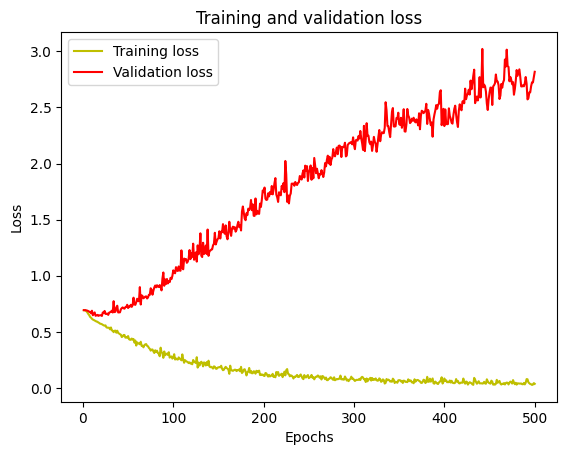

In [179]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

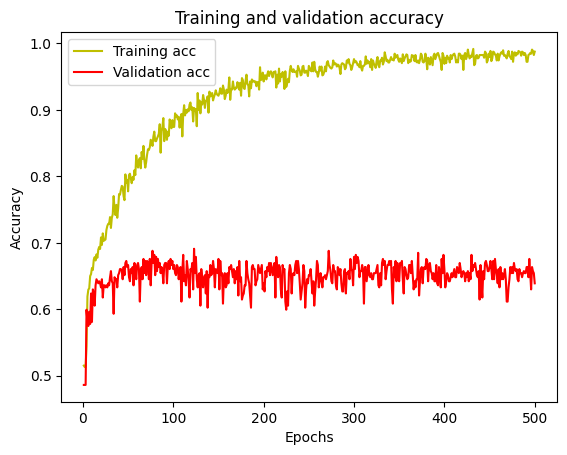

In [180]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [181]:
y_pred = best_model_f1.predict(X_test_gan_fs_real)
y_pred = (y_pred > 0.5)
print("best_f1:")
eval_model(y_test_gan.numpy(), y_pred)
y_pred = best_model_accuracy.predict(X_test_gan_fs_real)
y_pred = (y_pred > 0.5)
print("\nbest_accuracy:")
eval_model(y_test_gan.numpy(), y_pred)
y_pred = model.predict(X_test_gan_fs_real)
y_pred = (y_pred > 0.5)
print("\nlast epoch model:")
eval_model(y_test_gan.numpy(), y_pred)

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
best_f1:
              precision    recall  f1-score   support

         0.0       0.69      0.71      0.70       168
         1.0       0.68      0.67      0.68       159

    accuracy                           0.69       327
   macro avg       0.69      0.69      0.69       327
weighted avg       0.69      0.69      0.69       327

confusion matrix: 
 [[119  49]
 [ 53 106]]
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step

best_accuracy:
              precision    recall  f1-score   support

         0.0       0.67      0.79      0.72       168
         1.0       0.72      0.59      0.65       159

    accuracy                           0.69       327
   macro avg       0.70      0.69      0.69       327
weighted avg       0.70      0.69      0.69       327

confusion matrix: 
 [[132  36]
 [ 65  94]]
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

last epoch model:
              precision    recall  f1-score   support

         0.0       0.68      0.57      0.62

### mlp with simulated data

In [182]:
f1_callback = F1Callback(validation_data=(X_test_gan_fs, y_test_gan.numpy().reshape(-1, 1)), path="best_model/simulated")

checkpoint = ModelCheckpoint(
    'best_model/simulated/best_model.keras',                # Nombre del archivo donde se guarda el modelo
    monitor='val_accuracy',         # Métrica que se monitoriza
    mode='max',                     # Maximizar la métrica (para accuracy o F1)
    save_best_only=True,            # Solo guardar el mejor modelo
    verbose=1
)

model = simple_nn(X_test_gan_fs.shape[1])
history = model.fit(X_train_simulated_fs, y_train_simulated.reshape(-1, 1) ,verbose=1, epochs=600, batch_size=512,
                    validation_data=(X_test_gan_fs, y_test_gan.numpy().reshape(-1, 1)), callbacks=[checkpoint, f1_callback])
best_model_accuracy = tf.keras.models.load_model('best_model/simulated/best_model.keras')
best_model_f1 = tf.keras.models.load_model('best_model/simulated/best_model_f1.keras')

Epoch 1/600
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5296 - loss: 0.6930
Epoch 1: val_accuracy improved from -inf to 0.54434, saving model to best_model/simulated/best_model.keras
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.5318 - loss: 0.6930 - val_accuracy: 0.5443 - val_loss: 0.6929
Epoch 2/600
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6469 - loss: 0.6925
Epoch 2: val_accuracy improved from 0.54434 to 0.59939, saving model to best_model/simulated/best_model.keras
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.6473 - loss: 0.6925 - val_accuracy: 0.5994 - val_loss: 0.6924
Epoch 3/600
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6782 - loss: 0.6916
Epoch 3: val_accuracy did not improve from 0.59939
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.6792 - loss: 0.6915 - val_accuracy: 0.5963 - val_loss: 0.6914
Epoch 

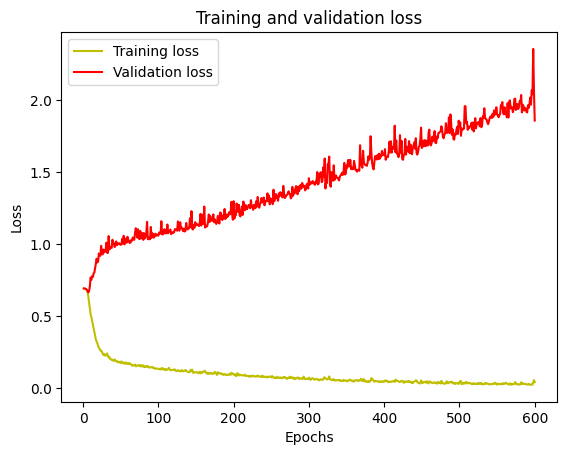

In [186]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

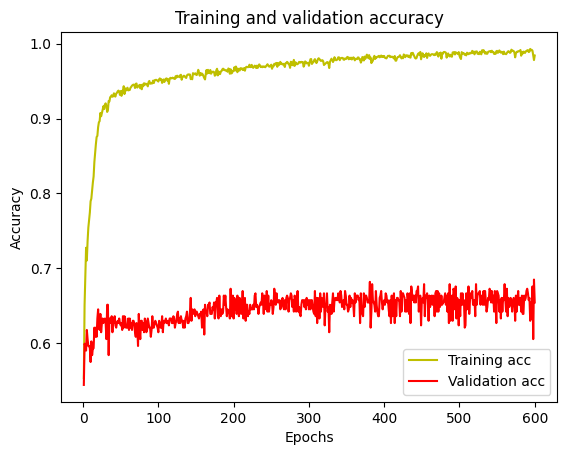

In [187]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [188]:
y_pred = best_model_f1.predict(X_test_gan_fs)
y_pred = (y_pred > 0.5)
print("best_f1:")
eval_model(y_test_gan.numpy(), y_pred)
y_pred = best_model_accuracy.predict(X_test_gan_fs)
y_pred = (y_pred > 0.5)
print("\nbest_accuracy:")
eval_model(y_test_gan.numpy(), y_pred)
y_pred = model.predict(X_test_gan_fs)
y_pred = (y_pred > 0.5)
print("\nlast epoch model:")
eval_model(y_test_gan.numpy(), y_pred)

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
best_f1:
              precision    recall  f1-score   support

         0.0       0.68      0.72      0.70       168
         1.0       0.68      0.64      0.66       159

    accuracy                           0.68       327
   macro avg       0.68      0.68      0.68       327
weighted avg       0.68      0.68      0.68       327

confusion matrix: 
 [[121  47]
 [ 57 102]]
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

best_accuracy:
              precision    recall  f1-score   support

         0.0       0.66      0.79      0.72       168
         1.0       0.72      0.57      0.64       159

    accuracy                           0.69       327
   macro avg       0.69      0.68      0.68       327
weighted avg       0.69      0.69      0.68       327

confusion matrix: 
 [[133  35]
 [ 68  91]]
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

last epoch model:
              precision    recall  f1-score   support

         0.0       0.71      0.56      0.

### cv

In [68]:
def rf_report(X_train, X_test, y_train, y_test):

    rf = RandomForestClassifier(random_state=42)

    # Entrenar el modelo
    rf.fit(X_train, y_train)
    
    # Predecir en el conjunto de prueba
    y_pred = rf.predict(X_test)
    
    # Generar classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    
    print(classification_report(y_test, y_pred))
    print(confusion_matrix(y_test, y_pred))
    print("=" * 50)

    return report

def classification_average_report(classification_reports):
    # Promediar métricas entre folds (opcional)
    average_report = {
        metric: np.mean([fold_report[metric]["f1-score"] for fold_report in classification_reports])
        for metric in classification_reports[0].keys()
        if isinstance(classification_reports[0][metric], dict)
    }

    print("Average F1-scores across folds:")
    for class_label, avg_score in average_report.items():
        print(f"Class {class_label}: {avg_score:.4f}")

def gan_cv(X, y):

    kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    num_classes = 2
    classification_reports_real = []
    classification_reports_sim = []
    for fold, (train_idx, test_idx) in enumerate(kf.split(X.to_numpy(), y)):

        #prep
        X_train, X_test = X.to_numpy()[train_idx], X.to_numpy()[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        X_train = torch.tensor(X_train, dtype=torch.float32)
        y_train = torch.tensor(y_train, dtype=torch.float32)

        X_test = torch.tensor(X_test, dtype=torch.float32)
        y_test = torch.tensor(y_test, dtype=torch.float32)

        dataset = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train))
        dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

        c_gen = train_wgan("cgan", dataloader, cgan=True, num_classes=num_classes)
        c_gen.eval()

        data_size = 100

        noise_vector_1 = torch.randn(data_size, Z_DIM).to(device)
        noise_vector_0 = torch.randn(data_size, Z_DIM).to(device)

        ones_encoded = F.one_hot(torch.ones(data_size).long(), num_classes=num_classes).to(device)
        zeros_encoded = F.one_hot(torch.zeros(data_size).long(), num_classes=num_classes).to(device)

        with torch.no_grad():
            simulated_data_set_1_cgan = c_gen(torch.cat((noise_vector_1, ones_encoded), dim = 1))
            simulated_data_set_0_cgan = c_gen(torch.cat((noise_vector_0, zeros_encoded), dim = 1))
        
        simulated_x = np.concatenate((simulated_data_set_1_cgan.numpy(), simulated_data_set_0_cgan.numpy()), axis=0)
        simulated_y = np.concatenate((np.ones(simulated_data_set_1_cgan.shape[0]), np.zeros(simulated_data_set_0_cgan.shape[0])), axis=0).astype(np.float32)
        simulated_x, simulated_y = shuffle(simulated_x, simulated_y, random_state=42)

        X_train_simulated = np.concatenate((X_train.numpy(), simulated_x), axis=0)
        y_train_simulated = np.concatenate((y_train.numpy(), simulated_y), axis=0)
        X_train_simulated, y_train_simulated = shuffle(X_train_simulated, y_train_simulated, random_state=42)

        print(f"Fold: {fold}, real data:")
        real_report = rf_report(X_train.numpy(), X_test.numpy(), y_train.numpy(), y_test.numpy())
        print(f"Fold: {fold}, simulated data:")
        sim_report = rf_report(X_train_simulated, X_test.numpy(), y_train_simulated, y_test.numpy())


        classification_reports_real.append(real_report)
        classification_reports_sim.append(sim_report)
    print("Real average")
    classification_average_report(classification_reports_real)
    print("Simulated average")
    classification_average_report(classification_reports_sim)

In [ ]:
gan_cv(X_gan, y_gan)

# Autoencoder

In [70]:
class Autoencoder(nn.Module):
    def __init__(self, feature_size, encoding_dim = 32):
        super(Autoencoder, self).__init__()         
        self.encoder = nn.Sequential(
            nn.Linear(feature_size, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, encoding_dim)
        )

        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(encoding_dim, 64),
            torch.nn.ReLU(),
            torch.nn.Linear(64, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, 512),
            torch.nn.ReLU(),
            torch.nn.Linear(512, feature_size),
            torch.nn.Sigmoid()
        )
 
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

## prep

In [71]:
num_epochs = 1000
LEARNING_RATE_ae = 0.0001
device = "cuda" if torch.cuda.is_available() else "cpu"

In [66]:
X_ae, y_ae = full_pipeline(merged, "CRC", "species", mapping_df, "norm", all_disease=False)

feature_size = X_ae.shape[1]

X_ae_train, X_ae_test, y_ae_train, y_ae_test = train_test_split(X_ae, y_ae, test_size=0.25, random_state=42)

X_ae_train = torch.tensor(X_ae_train.to_numpy(), dtype=torch.float32)
X_ae_test = torch.tensor(X_ae_test.to_numpy(), dtype=torch.float32)
y_ae_train = torch.tensor(y_ae_train, dtype=torch.float32)
y_ae_test = torch.tensor(y_ae_test, dtype=torch.float32)

dataset = TensorDataset(torch.tensor(X_ae.to_numpy(), dtype = torch.float32), torch.tensor(y_ae, dtype = torch.float32))
dataloader_ae = DataLoader(dataset, batch_size=64, shuffle=True)

## train

In [72]:
def train_autoencoder(path, loader, encoding_dim = 100):
    # Initialize the autoencoder
    model = Autoencoder(feature_size, encoding_dim)
    
    model.to(device)

    # Define the loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE_ae)
    
    writer_real = SummaryWriter(f"runs/{path}/real")
    writer_fake = SummaryWriter(f"runs/{path}/fake")

    step = 0

    model.train()
    
    # Train the autoencoder
    for epoch in range(num_epochs):
        for data, _ in loader:
            data = data.to(device)
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, data)
            loss.backward()
            optimizer.step()
        if epoch % 5 == 0:
            print('Epoch [{}/{}], Loss: {:.8f}'.format(epoch+1, num_epochs, loss.item()))

            with torch.no_grad():
                
                real_sample = data[:32]
                fake_sample = output[:32]
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(real_sample, normalize=True, nrow=1)
                img_grid_fake = torchvision.utils.make_grid(fake_sample, normalize=True, nrow=1)

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)

            step += 1
    return model

In [73]:
from torchvision.utils import make_grid

def visualize_images_in_grid(tensors, nrow=8, figsize=(10, 10)):
    
    if tensors.ndimension() != 4:
        raise ValueError("El tensor debe tener 4 dimensiones: (N, C, H, W)")

    # Normalizar las imágenes si están en un rango que no es [0, 1]
    if tensors.min() < 0 or tensors.max() > 1:
        tensors = (tensors - tensors.min()) / (tensors.max() - tensors.min())

    # Crear el grid de imágenes
    grid = make_grid(tensors, nrow=nrow, padding=2, normalize=False)

    # Convertir el tensor a numpy para mostrarlo
    np_grid = grid.permute(1, 2, 0).numpy()

    # Dibujar la imagen
    plt.figure(figsize=figsize)
    plt.imshow(np_grid)
    plt.axis('off')
    plt.show()

In [75]:
!rm -rf runs/autoencoder
%reload_ext tensorboard
%tensorboard --logdir runs/autoencoder

Reusing TensorBoard on port 6006 (pid 37402), started 0:00:02 ago. (Use '!kill 37402' to kill it.)

In [76]:
ae = train_autoencoder('autoencoder', dataloader_ae)
encoder = ae.encoder

Epoch [1/1000], Loss: 0.24168380
Epoch [6/1000], Loss: 0.00026872
Epoch [11/1000], Loss: 0.00013686
Epoch [16/1000], Loss: 0.00009775
Epoch [21/1000], Loss: 0.00013762
Epoch [26/1000], Loss: 0.00009319
Epoch [31/1000], Loss: 0.00007506
Epoch [36/1000], Loss: 0.00009243
Epoch [41/1000], Loss: 0.00012454
Epoch [46/1000], Loss: 0.00008775
Epoch [51/1000], Loss: 0.00009426
Epoch [56/1000], Loss: 0.00011192
Epoch [61/1000], Loss: 0.00014418
Epoch [66/1000], Loss: 0.00006947
Epoch [71/1000], Loss: 0.00013465
Epoch [76/1000], Loss: 0.00009772
Epoch [81/1000], Loss: 0.00008425
Epoch [86/1000], Loss: 0.00007821
Epoch [91/1000], Loss: 0.00010532
Epoch [96/1000], Loss: 0.00008429
Epoch [101/1000], Loss: 0.00009494
Epoch [106/1000], Loss: 0.00016175
Epoch [111/1000], Loss: 0.00008240
Epoch [116/1000], Loss: 0.00011040
Epoch [121/1000], Loss: 0.00009092
Epoch [126/1000], Loss: 0.00011322
Epoch [131/1000], Loss: 0.00010095
Epoch [136/1000], Loss: 0.00010848
Epoch [141/1000], Loss: 0.00010765
Epoch [

## dim red

In [77]:
with torch.no_grad():
    X_train_ae_dr = encoder(X_ae_train)
    X_test_ae_dr = encoder(X_ae_test)

## testing

In [80]:
rf_train_test(X_train_ae_dr, X_test_ae_dr, y_ae_train, y_ae_test)

              precision    recall  f1-score   support

         0.0       0.52      0.49      0.51       168
         1.0       0.49      0.52      0.51       159

    accuracy                           0.51       327
   macro avg       0.51      0.51      0.51       327
weighted avg       0.51      0.51      0.51       327

confusion matrix: 
 [[83 85]
 [76 83]]


# CNN

In [66]:
from functools import partial

def build_cnn(feature_size):
    
    model = Sequential([
        Input(shape=(feature_size, feature_size, 1)),
        Conv2D(filters=64, kernel_size=3, activation='relu', padding='SAME'),
        MaxPooling2D(pool_size=2),
        Conv2D(filters=128, kernel_size=3, activation='relu', padding='SAME'),
        Conv2D(filters=128, kernel_size=3, activation='relu', padding='SAME'),
        MaxPooling2D(pool_size=2),
        Conv2D(filters=256, kernel_size=3, activation='relu', padding='SAME'),
        Conv2D(filters=256, kernel_size=3, activation='relu', padding='SAME'),
        MaxPooling2D(pool_size=2),
        Flatten(),
        Dense(units=128, activation='relu'),
        Dropout(0.5),
        Dense(units=64, activation='relu'),
        Dropout(0.5),
        Dense(units=2, activation='softmax'),
    ])
    model.compile(loss='categorical_crossentropy',
        optimizer=Adam(learning_rate=0.0001),             #also try adam
        metrics=['accuracy'])
    return model
        

In [114]:
# creating a CNN class
class ConvNeuralNet(nn.Module):
	#  determine what layers and their order in CNN object 
    def __init__(self, num_classes):
        super(ConvNeuralNet, self).__init__()
        self.conv_layer1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1)
        self.relu1 = nn.ReLU()
        self.max_pool1 = nn.MaxPool2d(kernel_size=3, stride=2)

        self.conv_layer2 = nn.Conv2d(in_channels=64, out_channels=192, kernel_size=4, padding=1)
        self.relu2 = nn.ReLU()
        self.max_pool2 = nn.MaxPool2d(kernel_size=3, stride=2)

        self.conv_layer3 = nn.Conv2d(in_channels=192, out_channels=384, kernel_size=3, padding=1)
        self.relu3 = nn.ReLU()
        
        self.conv_layer4 = nn.Conv2d(in_channels=384, out_channels=256, kernel_size=3, padding=1)
        self.relu4 = nn.ReLU()

        self.conv_layer5 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1)
        self.relu5 = nn.ReLU()
        self.max_pool5 = nn.MaxPool2d(kernel_size=3, stride=2)
        
        self.dropout6 = nn.Dropout(p=0.5)
        self.fc6 = nn.Linear(1024, 512)
        self.relu6 = nn.ReLU()
        self.dropout7 = nn.Dropout(p=0.5)
        self.fc7 = nn.Linear(512, 256)
        self.relu7 = nn.ReLU()
        self.fc8 = nn.Linear(256, num_classes)

        self.softmax = nn.Softmax()

    # progresses data across layers    
    def forward(self, x):
        out = self.conv_layer1(x)
        out = self.relu1(out)
        out = self.max_pool1(out)
        
        out = self.conv_layer2(out)
        out = self.relu2(out)
        out = self.max_pool2(out)

        out = self.conv_layer3(out)
        out = self.relu3(out)

        out = self.conv_layer4(out)
        out = self.relu4(out)

        out = self.conv_layer5(out)
        out = self.relu5(out)
        out = self.max_pool5(out)
        
        out = out.reshape(out.size(0), -1)
        
        out = self.dropout6(out)
        out = self.fc6(out)
        out = self.relu6(out)

        out = self.dropout7(out)
        out = self.fc7(out)
        out = self.relu7(out)

        out = self.fc8(out)  # final logits
        return self.softmax(out)

train

In [125]:
def train_cnn(loader, num_classes = 2, num_epochs = 100):
    # Initialize the autoencoder
    model = ConvNeuralNet(num_classes)
    
    LEARNING_RATE_cnn = 0.0001
    model.to(device)

    # Define the loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE_cnn)

    for epoch in range(num_epochs):

        model.train()
        for i, (images, labels) in enumerate(loader):  
            # move tensors to the configured device
            images = images.to(device)
            labels = labels.to(device)
            labels = F.one_hot(labels.long(), num_classes=num_classes).float()
            # forward propagation
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            # backward propagation and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        with torch.no_grad():
            # switch model to eval (not train) model
            model.eval()
            correct = 0
            total = 0
            all_val_loss = []
            for images, labels in loader:
                images = images.to(device)
                labels = labels.to(device)
                labels = F.one_hot(labels.long(), num_classes=num_classes).float()
                outputs = model(images)
                total += labels.size(0)
                # calculate predictions
                predicted = torch.argmax(outputs, dim=1)
                labels = torch.argmax(labels, dim=1)
                # calculate actual values
                correct += (predicted == labels).sum().item()
                # calculate the loss
                all_val_loss.append(criterion(outputs, labels).item())
            # calculate val-loss
            mean_val_loss = sum(all_val_loss) / len(all_val_loss)
            # calculate val-accuracy
            mean_val_acc = 100 * (correct / total)
        print(
            'Epoch [{}/{}], Loss: {:.4f}, Val-loss: {:.4f}, Val-acc: {:.1f}%'.format(
                epoch+1, num_epochs, loss.item(), mean_val_loss, mean_val_acc
            )
        )
    return model

In [ ]:
cnn = train_cnn(dataloader_ae)

## model

## prep

In [25]:
X_cnn, y_cnn = full_pipeline(merged, "CRC", "species", mapping_df, "norm", "mi", all_disease=False, top_n = 676)

In [55]:
X_train_cnn, X_test_cnn, y_train_cnn, y_test_cnn = train_test_split(X_cnn, y_cnn, test_size=0.25, random_state=42)

X_train_cnn = X_train_cnn.to_numpy().reshape(X_train_cnn.shape[0], 26, 26, 1)
X_test_cnn = X_test_cnn.to_numpy().reshape(X_test_cnn.shape[0], 26, 26, 1)

y_train_cnn = to_categorical(y_train_cnn)
y_test_cnn = to_categorical(y_test_cnn)

## train

In [79]:
#f1_callback = F1Callback(validation_data=(X_test_cnn, y_test_cnn), path="best_model/cnn")

checkpoint = ModelCheckpoint(
    'best_model/cnn/best_model.keras',                # Nombre del archivo donde se guarda el modelo
    monitor='val_accuracy',         # Métrica que se monitoriza
    mode='max',                     # Maximizar la métrica (para accuracy o F1)
    save_best_only=True,            # Solo guardar el mejor modelo
    verbose=1
)

model = build_cnn(26)
history = model.fit(X_train_cnn, y_train_cnn ,verbose=1, epochs=500, batch_size=32,
                    validation_data=(X_test_cnn, y_test_cnn), callbacks=[checkpoint])
best_model_accuracy = tf.keras.models.load_model('best_model/cnn/best_model.keras')
#best_model_f1 = tf.keras.models.load_model('best_model/cnn/best_model_f1.keras')

Epoch 1/500
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.4715 - loss: 0.6933
Epoch 1: val_accuracy improved from -inf to 0.48624, saving model to best_model/cnn/best_model.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.4720 - loss: 0.6933 - val_accuracy: 0.4862 - val_loss: 0.6932
Epoch 2/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.4851 - loss: 0.6934
Epoch 2: val_accuracy did not improve from 0.48624
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.4855 - loss: 0.6934 - val_accuracy: 0.4862 - val_loss: 0.6934
Epoch 3/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5229 - loss: 0.6931
Epoch 3: val_accuracy did not improve from 0.48624
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.5226 - loss: 0.6931 - val_accuracy: 0.4862 - val_loss: 0.6934
Epoch 4/500
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5106 - loss: 0.6930
Epoch 4: val_accuracy did not improve from 0.48624
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.

KeyboardInterrupt: 

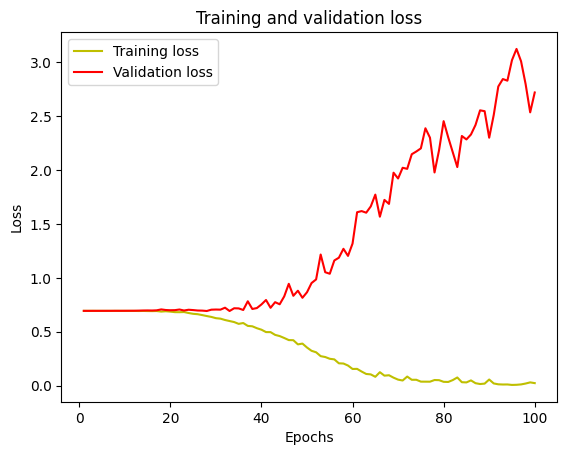

In [69]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

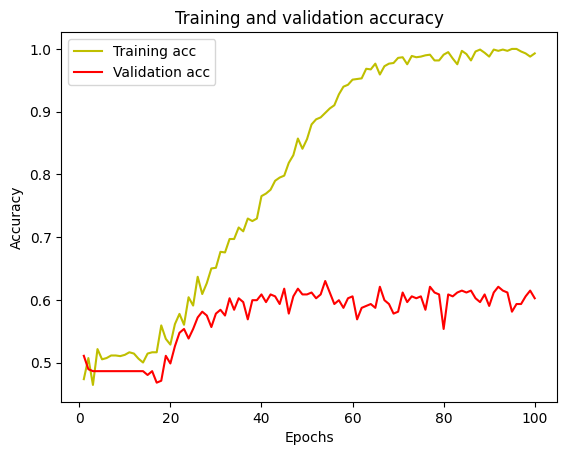

In [70]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [78]:
y_pred = best_model_accuracy.predict(X_test_cnn)
y_pred = np.argmax(y_pred, axis=1)
print("\nbest_accuracy:")
eval_model(np.argmax(y_test_cnn, axis=1), y_pred)
y_pred = model.predict(X_test_cnn)
y_pred = np.argmax(y_pred, axis=1)
print("\nlast epoch model:")
eval_model(np.argmax(y_test_cnn, axis=1), y_pred)

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

best_accuracy:
              precision    recall  f1-score   support

           0       0.65      0.60      0.63       168
           1       0.61      0.66      0.63       159

    accuracy                           0.63       327
   macro avg       0.63      0.63      0.63       327
weighted avg       0.63      0.63      0.63       327

confusion matrix: 
 [[101  67]
 [ 54 105]]
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

last epoch model:
              precision    recall  f1-score   support

           0       0.63      0.54      0.58       168
           1       0.58      0.67      0.62       159

    accuracy                           0.60       327
   macro avg       0.61      0.60      0.60       327
weighted avg       0.61      0.60      0.60       327

confusion matrix: 
 [[ 90  78]
 [ 52 107]]
